# Bayesian Optimisation: ERK Oscillation (v10 — led_power, NO light budget)

This notebook adds **LED power** as a BO control axis and reverts to the
v8-style direct `(stim_exposure, ramp, pulse_interval)` parameterisation
— i.e. **no light-budget reparameterisation**.

| Notebook | Power axis | Time/intensity axes |
|---|---|---|
| `…_testv10_led_power.ipynb` (this) | **`led_power` (BO axis, log-scaled)** | `stim_exposure × ramp × pulse_interval` (direct, v8-style) |
| `…_testv11_light_budget.ipynb` | fixed at 10 % | `light_budget × ramp_fraction × pulse_interval` (v9-style) |

**Why drop the light-budget reparameterisation?**

With LED power as a separate axis, the energy delivered per pulse is
`exposure × power_factor`.  Holding `light_budget` (total summed
exposure-ms) constant no longer constrains delivered energy — the BO
would have to learn that `(low budget × high power)` ≈ `(high budget ×
low power)` in the LED-linear regime.  Going back to direct exposure
control sidesteps that redundancy and lets the BO discover the
LED-saturation curve directly.

**Search space:**

- `stim_exposure` (ms): 25–1000 step 25 = 40 levels.  Per-pulse base
  exposure; the runtime clips per-pulse delivery at 1000 ms even when
  ramp pushes a later pulse above that ceiling (`MAX_STIM_EXPOSURE_MS`).
- `ramp` (ms/pulse): 0–50 step 10 = 6 levels.  Coarsened from v8's
  step-5 to keep the 4-axis grid manageable.
- `pulse_interval` (frames): 1–10 step 2 = 5 levels ⇒ {1, 3, 5, 7, 9}.
- `led_power` (%): 10–100 step 10 with **log-scaled GP scaler** = 10
  levels.  The kernel sees `log(power)` so length-scales stay uniform
  across the saturating tail (your observation: response saturates
  above ~30–40 %).

Total grid: 40 × 6 × 5 × 10 = **12 000 candidate conditions**.

**FOV finder pre-screen.**  Same as v11: the pre-phase scan now
acquires miRFP + mScarlet3, runs `FE_ErkKtr`, and rejects FOVs where
fewer than 75 % of cells have baseline CNR < 1.0.

**Objective and quality gates** unchanged from v9
(`frac_responders`, `max_baseline_cnr=1.0`, `min_track_fraction=0.8`).


In [1]:
import os
import time
import logging
import importlib.util
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Suppress JAX/XLA debug messages
os.environ["JAX_LOG_COMPILES"] = "0"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

import jax

jax.config.update("jax_log_compiles", False)
for _name in list(logging.Logger.manager.loggerDict):
    if "jax" in _name or "absl" in _name:
        logging.getLogger(_name).setLevel(logging.WARNING)

# ---------------------------------------------------------------------------
# gpax/numpyro compatibility shim
# ---------------------------------------------------------------------------
# numpyro >= 0.20 removed haiku support from numpyro.contrib.module, but
# gpax 0.1.9 eagerly imports viDKL via gpax/models/__init__.py, which tries
# `from numpyro.contrib.module import random_haiku_module, haiku_module`.
# We don't use viDKL (only ExactGP, viGP, viSparseGP), so we install stubs
# that raise only if viDKL is actually called. This MUST run before any
# `import gpax` (including the lazy ones inside the BO agent classes).
import numpyro.contrib.module as _ncm


def _haiku_unavailable(*_args, **_kwargs):
    raise NotImplementedError(
        "haiku support was removed from numpyro >= 0.20. "
        "viDKL is not available. Use ExactGP, viGP, or viSparseGP."
    )


if not hasattr(_ncm, "random_haiku_module"):
    _ncm.random_haiku_module = _haiku_unavailable
if not hasattr(_ncm, "haiku_module"):
    _ncm.haiku_module = _haiku_unavailable
# ---------------------------------------------------------------------------

from faro.core.data_structures import (
    PowerChannel,
    SegmentationMethod,
)
from faro.core.controller import Controller
from faro.core.pipeline import ImageProcessingPipeline
from faro.agents.bo_optimization import (
    BO_Parameter,
    BO_Objective,
    BO_Covariate,
)
from faro.agents.bo_oscillation import OscillationBO
import faro.core.utils as utils

## Microscope & pipeline setup

**Microscope:** Jungfrau (no DMD -- full-FOV stimulation).

**Channels:**
- Imaging: miRFP (nuclear marker) + mScarlet3 (ERK-KTR reporter)
- Stimulation: CyanStim (optogenetic activation, power 10)
- Optocheck: mCitrine (verify optoRTK expression, last frame only)

**Pipeline:** CellposeV4 segmentation -> ERK-KTR FE -> Trackpy tracking
-> OptoCheckFE on reference frames. Full-FOV stimulation (no DMD).

In [2]:
from faro.microscope.pertzlab.jungfrau import Jungfrau

mic = Jungfrau()
mic.mmc.setChannelGroup("TTL_ERK")
mic.mmc.setProperty("TIPFSStatus", "State", "On")

In [5]:
mic.mmc.getProperty("TIPFSStatus", "Status")

'Locked in focus'

In [3]:
import napari
from napari_micromanager import MainWindow

viewer = napari.Viewer()
mm_wdg = MainWindow(viewer)
mm_wdg._mmc = mic.mmc  # point the widget at our CMMCore instance
viewer.window.add_dock_widget(mm_wdg)  # dock Micro-Manager controls in napari

In [6]:
WELLS = []
START_COL = 2
END_COL = 12
for i, row in enumerate("ABCDEFGH"):
    cols = (
        range(START_COL, END_COL + 1)
        if i % 2 == 0
        else range(END_COL, START_COL - 1, -1)
    )
    WELLS.extend(f"{row}{c}" for c in cols)

WELLS = WELLS[5::]

In [7]:
WELLS

['A7',
 'A8',
 'A9',
 'A10',
 'A11',
 'A12',
 'B12',
 'B11',
 'B10',
 'B9',
 'B8',
 'B7',
 'B6',
 'B5',
 'B4',
 'B3',
 'B2',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'D12',
 'D11',
 'D10',
 'D9',
 'D8',
 'D7',
 'D6',
 'D5',
 'D4',
 'D3',
 'D2',
 'E2',
 'E3',
 'E4',
 'E5',
 'E6',
 'E7',
 'E8',
 'E9',
 'E10',
 'E11',
 'E12',
 'F12',
 'F11',
 'F10',
 'F9',
 'F8',
 'F7',
 'F6',
 'F5',
 'F4',
 'F3',
 'F2',
 'G2',
 'G3',
 'G4',
 'G5',
 'G6',
 'G7',
 'G8',
 'G9',
 'G10',
 'G11',
 'G12',
 'H12',
 'H11',
 'H10',
 'H9',
 'H8',
 'H7',
 'H6',
 'H5',
 'H4',
 'H3',
 'H2']

In [8]:
len(WELLS)

83

In [8]:
# --- Experiment parameters ---
TIME_BETWEEN_TIMESTEPS = 60  # seconds (1 frame/min)

# --- Phase layout (frames; 1 frame == 1 minute at TIME_BETWEEN_TIMESTEPS=60) ---
N_FRAMES_BASELINE = 10
N_FRAMES_STIM = 60
N_FRAMES_RECOVERY = 20

# Derived (don't edit -- adjust the three above instead).
N_FRAMES = N_FRAMES_BASELINE + N_FRAMES_STIM + N_FRAMES_RECOVERY  # 90
FIRST_FRAME_STIM = N_FRAMES_BASELINE  # 10
LAST_FRAME_STIM = FIRST_FRAME_STIM + N_FRAMES_STIM  # 70

# --- Plate calibration ---
PLATE_CALIBRATION_PATH = r"./calib_plate_96.json"  # <-- UPDATE

# --- FOV finder knobs ---
FOV_BORDER_UM = 1000.0
FOV_MIN_DISTANCE_UM = 750.0
FOV_MIN_CELLS = 35
FOV_N_CANDIDATES_PER_WELL = 10

# --- Phased FOV layout ---
N_WELLS_PER_PHASE = 6
FOVS_PER_WELL = 3
N_FOVS = N_WELLS_PER_PHASE * FOVS_PER_WELL  # 18 FOVs per phase
N_CONDITIONS_PER_ITER = 3
FOVS_PER_CONDITION = N_FOVS // N_CONDITIONS_PER_ITER
N_PHASES = 13

WELLS = WELLS[: N_PHASES * N_WELLS_PER_PHASE]


# --- Storage ---
base_path = "E:\\Alex"
experiment_name = "2026-05-07_bo_erk_oscillation_v10_led_power"
path = os.path.join(base_path, experiment_name)

# --- Stimulation channel (base -- exposure is overridden by BO; power fixed) ---
stim_channel = PowerChannel(
    config="CyanStim",
    exposure=100,
    group="TTL_ERK",
    power=10,
)

# --- Imaging channels (acquired every timepoint AND used by FOV finder) ---
imaging_channels = (
    PowerChannel(config="miRFP", exposure=150, group="TTL_ERK", power=95),
    PowerChannel(config="mScarlet3", exposure=150, group="TTL_ERK", power=95),
)

# --- Optocheck channel (acquired on last frame only) ---
optocheck_channel = PowerChannel(
    config="mCitrine",
    exposure=600,
    group="TTL_ERK",
    power=95,
)

In [9]:
len(WELLS) / N_WELLS_PER_PHASE

13.0

In [10]:
from faro.stimulation.base import StimWholeFOV
from faro.tracking.trackpy import TrackerTrackpy
from faro.feature_extraction.erk_ktr import FE_ErkKtr
from faro.feature_extraction.optocheck import OptoCheckFE
from faro.segmentation.cellpose_v4 import CellposeV4

# A single Cellpose instance is shared by the experiment pipeline AND the
# FOVFinderAgent below.  Reusing the same model avoids loading it twice
# (memory + GPU savings) and guarantees that the FOV finder counts cells
# with exactly the same segmentation the experiment will use.
segmentator = CellposeV4(
    custom_model_path="E:\\models\\cellpose\\LifeActH2B_mixed_with_only_H2B_v1",
    min_size=100,
)

pipeline = ImageProcessingPipeline(
    storage_path=path,
    segmentators=[
        SegmentationMethod(
            name="labels",
            segmentation_class=segmentator,
            use_channel=0,  # segment on miRFP (nuclear marker)
            save_tracked=True,
        )
    ],
    feature_extractor=FE_ErkKtr("labels"),
    tracker=TrackerTrackpy(search_range=50),
    stimulator=StimWholeFOV(),
    feature_extractor_ref=OptoCheckFE(used_mask="labels"),
)

from faro.core.writers import OmeZarrWriter

writer = OmeZarrWriter(storage_path=path)

Directory E:\Alex\2026-05-07_bo_erk_oscillation_v10_led_power\tracks created 


## FOV selection (per-phase, automated)

Instead of manually selecting 18 positions in napari, a `FOVFinderAgent`
(plugged into the generic `ComposedAgent`) picks fresh positions before
**every phase**:

1. The agent loads the plate calibration (`WellPlatePlan` JSON saved by
   the pymmcore-widgets MDA plate widget).
2. It pops the next `N_WELLS_PER_PHASE` (= 6) wells from `WELLS`.
3. For each well it generates `FOV_N_CANDIDATES_PER_WELL` (= 8) random
   candidate positions, kept `FOV_BORDER_UM` µm away from the well edge
   and at least `FOV_MIN_DISTANCE_UM` apart from each other.
4. It snaps the candidates with the segmentation channel only (miRFP)
   via `mic.run_mda` and segments the result with the **same**
   `CellposeV4` instance the experiment pipeline uses (`segmentator`).
5. Candidates with `< FOV_MIN_CELLS` cells are dropped; the remaining
   ones are reduced to `FOVS_PER_WELL` (= 3) per well by greedy
   farthest-point sampling so the picked FOVs do not overlap.

The result (18 fresh FOVs / phase) is fed straight into
`OscillationBO.run_one_phase`, which is wired up by the `ComposedAgent`
in the next sections.

The segmentator was already created in the pipeline cell above and is
reused here -- no extra setup needed.  The `FOVFinderAgent` is constructed
in the *Configure and run* section together with the BO agent and the
composed driver.


## Oscillation classifier

Load the pre-trained sliding-window oscillation classifier. This model
uses FFT, ACF, and time-domain features extracted from the ERK-KTR
`cnr` trace to classify each window as oscillating or not.

The classifier is restricted at runtime to the **stimulation window
only** (via `OscillationBO.classifier_window`, which defaults to
`(FIRST_FRAME_STIM, LAST_FRAME_STIM)`). Baseline and recovery frames
are acquired but not classified.

The BO target in this notebook is **`frac_responders`** — per FOV, the
fraction of valid cells whose **mean** classifier osc-probability across
the scoring window is `>= frac_responder_threshold` (default 0.75).
This is computed *directly* from the classifier's per-window
probabilities; the legacy 3-gate `frac_oscillating` rule (FFT amplitude
+ max probability + consecutive windows) is **not** used by the BO and
is disabled in the cell below by setting all three thresholds to 0.

Cells are only included in the responder calculation if they pass two
quality gates:
- Tracked for `>= min_track_fraction * n_frames` (default 80 %)
- Baseline CNR `< max_baseline_cnr` (default 1.0)


In [11]:
import joblib

# --- Load pre-trained oscillation classifier ---
CLASSIFIER_PATH = r"./oscillation_model_60min.joblib"  # <-- UPDATE THIS PATH

model_data = joblib.load(CLASSIFIER_PATH)
osc_clf = model_data["clf"]
osc_scaler = model_data["scaler"]
osc_feature_cols = model_data["feature_cols"]
osc_cfg = model_data["config"]
osc_cfg["window_size"] = model_data["window_size"]
osc_cfg["window_step"] = model_data["window_step"]

# Import the predict_trace function from the classifier script
_classifier_script = "./apply_oscillation_classifier_v2.py"

_spec = importlib.util.spec_from_file_location("osc_classifier", _classifier_script)
_osc_module = importlib.util.module_from_spec(_spec)
_spec.loader.exec_module(_osc_module)
predict_trace = _osc_module.predict_trace

# --- Oscillation thresholds ---
# A cell is oscillating iff ALL three gates pass (>= for all):
#   1. FFT amplitude score >= 0.3
#   2. Max osc. probability >= 0.95
#   3. Consecutive osc. windows >= 3
MIN_OSC_PROBABILITY = (
    0.0  # v6: gates disabled, BO target is frac_responders (mean prob >= 0.75 per cell)
)
MIN_CONSECUTIVE_WINDOWS = 0
MIN_FFT_AMPLITUDE = 0.0

print(f"Loaded oscillation classifier from {CLASSIFIER_PATH}")
print(f"  Window: {osc_cfg['window_size']} steps, stride {osc_cfg['window_step']}")
print(
    f"  Thresholds: prob >= {MIN_OSC_PROBABILITY}, "
    f"consecutive >= {MIN_CONSECUTIVE_WINDOWS}, "
    f"fft_amplitude >= {MIN_FFT_AMPLITUDE}"
)

Loaded oscillation classifier from ./oscillation_model_60min.joblib
  Window: 20 steps, stride 5
  Thresholds: prob >= 0.0, consecutive >= 0, fft_amplitude >= 0.0


## Batch BO agent

The :class:`OscillationBO` subclass of :class:`BOptGPAX` lives in
``faro.agents.bo_oscillation``.  It overrides:

- ``_create_events_for_batch`` -- builds RTMEvents for ``N_FOVS`` FOVs across
  ``N_CONDITIONS_PER_ITER`` conditions (``FOVS_PER_CONDITION`` each), applying
  per-frame ramped stim exposure.
- ``_preprocess_results`` -- runs the oscillation classifier on each cell's
  ``cnr`` trace (sliced to the stimulation window via ``classifier_window``)
  and computes the per-FOV oscillating fraction. Also computes the
  ``baseline_cnr`` covariate from the first ``n_baseline_frames``.
- ``_on_phase_complete`` -- live plotting + checkpoint saving + saves the
  trained GP to ``{storage_path}/bo_model.joblib`` for post-hoc analysis.

All batch-BO machinery (sequential greedy acquisition with local penalisation,
FOV-index offsetting across phases, ``run_one_phase`` integration with
``ComposedAgent``) is inherited from ``BOptGPAX``.  See
[faro/agents/bo_oscillation.py](../../faro/agents/bo_oscillation.py).


## Configure and run Bayesian Optimisation

**Parameter space (v10 — direct (exposure, ramp, pulse_interval, power)):**

- `stim_exposure` (ms): 25–1000 step 25 = 40 levels (per-pulse base
  exposure).  Per-pulse delivery is also clipped at 1000 ms in
  `_create_events_for_batch` so ramp can never push a single pulse
  above the hardware ceiling.
- `ramp` (ms/pulse): 0–50 step 10 = 6 levels.
- `pulse_interval` (frames): 1–10 step 2 = 5 levels ⇒ {1, 3, 5, 7, 9}.
- `led_power` (%): 10–100 step 10, **`log_scale=True`** = 10 levels.
  The GP scaler takes `log(led_power)` so the kernel sees a near-linear
  response axis (biology saturates above ~30–40 %).

Total grid: 40 × 6 × 5 × 10 = **12 000 candidate conditions**.

**Initial exploration cap (`initial_exploration_cap=0.7`):**
First 2 phases restrict to `stim_exposure ≤ ~700 ms`, `ramp ≤ 35`,
`pulse_interval ≤ 7`, `led_power ≤ ~73 %` (cap applied per axis on
fraction-of-range; integer params snap to the next grid step).

**Covariates:** `n_cells`, `optortk_expression` (log-scaled),
`baseline_cnr`. Marginalised over during acquisition.

**Default objective: `frac_responders`** — per-FOV fraction of cells
whose per-cell mean classifier probability across the scoring window is
`≥ 0.75`.  Same as v9.

**FOV finder pre-screen.**  Same as v11: candidate FOVs are imaged with
miRFP + mScarlet3, segmented, run through `FE_ErkKtr`, and rejected
unless ≥ 75 % of cells have baseline CNR < 1.0.


In [13]:
import dataclasses

from faro.agents import FOVFinderAgent, ComposedAgent, FOVCondition
from faro.agents.bo_oscillation import MIN_STIM_EXPOSURE_MS
from faro.core.data_structures import RTMSequence
import faro.core.utils as faro_utils

# ---------------------------------------------------------------------------
# v10: led_power as a 4th BO control axis, no light-budget reparam
# ---------------------------------------------------------------------------
# OscillationBO speaks (stim_exposure, ramp, pulse_interval) and uses
# self.stim_channel for ALL conditions.  v10 adds led_power as a BO axis
# and constructs a fresh PowerChannel per condition with the BO-chosen
# power, so the microscope receives the right intensity for each
# acquisition.  Per-pulse exposure is also clipped at MAX_STIM_EXPOSURE_MS
# (1000 ms) so ramp can never push a single pulse above the user-
# configured ceiling.


class PoweredOscillationBO(OscillationBO):
    """OscillationBO subclass that adds led_power as a BO control axis."""

    MAX_STIM_EXPOSURE_MS: float = 5000.0

    def _create_events_for_batch(self, param_list):
        # Replicates OscillationBO._create_events_for_batch with two diffs:
        #   (1) per-pulse exposure CLIPPED at MAX_STIM_EXPOSURE_MS in
        #       addition to the >=25 ms floor inherited from MIN_STIM_EXPOSURE_MS.
        #   (2) a fresh PowerChannel with the BO-chosen led_power is
        #       constructed per condition instead of reusing self.stim_channel.
        phase_id = self._phase_counter
        all_events = []
        fovs_per_condition = self.fovs_per_condition
        self._current_condition_map = {}

        for cond_idx, params in enumerate(param_list):
            start = cond_idx * fovs_per_condition
            end = start + fovs_per_condition
            cond_positions = self.fov_positions[start:end]

            for fov_idx in range(start, end):
                self._current_condition_map[fov_idx + self._fov_index_offset] = params

            base_exp = float(params["stim_exposure"])
            ramp = float(params["ramp"])
            pulse_interval = max(1, int(params.get("pulse_interval", 1)))
            led_power = int(round(float(params["led_power"])))

            all_frames = list(
                range(self.first_frame_stim, self.last_frame_stim, pulse_interval)
            )
            # Cap per-pulse exposure at MAX (5000 ms); pulses driven above
            # the cap by ramp would otherwise risk hardware unreliability.
            all_exposures = [
                min(base_exp + ramp * i, self.MAX_STIM_EXPOSURE_MS)
                for i in range(len(all_frames))
            ]

            kept = [
                (f, e)
                for f, e in zip(all_frames, all_exposures)
                if e >= MIN_STIM_EXPOSURE_MS
            ]
            n_dropped = len(all_frames) - len(kept)
            if n_dropped > 0:
                print(
                    f"  Cond {cond_idx}: dropped {n_dropped}/{len(all_frames)} "
                    f"sub-{MIN_STIM_EXPOSURE_MS:g}ms pulses"
                )

            if not kept:
                print(
                    f"  Cond {cond_idx}: ALL {len(all_frames)} pulses below "
                    f"{MIN_STIM_EXPOSURE_MS:g}ms floor -- emitting NO stim "
                    f"events for this condition (imaging only)"
                )
                stim_frames = frozenset()
                exposures = ()
            else:
                stim_frames = frozenset(f for f, _ in kept)
                exposures = tuple(e for _, e in kept)

            # Per-condition stim channel with the BO-chosen LED power.
            cond_stim_channel = dataclasses.replace(self.stim_channel, power=led_power)

            acq = RTMSequence(
                time_plan={
                    "interval": self.time_between_timesteps,
                    "loops": self.n_frames,
                },
                stage_positions=cond_positions,
                channels=self.imaging_channels,
                stim_channels=(cond_stim_channel,),
                stim_frames=stim_frames,
                stim_exposure=exposures,
                ref_channels=(self.optocheck_channel,),
                ref_frames=frozenset({self.n_frames - 1}),
                rtm_metadata={
                    "phase_name": f"BO_iter_{phase_id}_cond_{cond_idx}",
                    "phase_id": phase_id,
                    "condition_idx": cond_idx,
                    "stim_exposure": base_exp,
                    "ramp": ramp,
                    "pulse_interval": pulse_interval,
                    "led_power": led_power,
                },
            )

            p_offset = cond_idx * fovs_per_condition + self._fov_index_offset
            for ev in acq:
                local_p = ev.index.get("p", 0)
                all_events.append(
                    ev.model_copy(
                        update={"index": {**dict(ev.index), "p": local_p + p_offset}}
                    )
                )

        all_events = faro_utils.apply_fov_batching(all_events, time_per_fov=2.0)

        print(f"  Created {len(all_events)} events for phase {phase_id}")
        for i, p in enumerate(param_list):
            exp_start = p["stim_exposure"]
            pi = max(1, int(p.get("pulse_interval", 1)))
            n_pulses_i = len(range(self.first_frame_stim, self.last_frame_stim, pi))
            exp_end = min(
                exp_start + p["ramp"] * (n_pulses_i - 1), self.MAX_STIM_EXPOSURE_MS
            )
            fov_start = i * fovs_per_condition + self._fov_index_offset
            fov_end = fov_start + fovs_per_condition - 1
            print(
                f"    Cond {i} (FOVs {fov_start}-{fov_end}): "
                f"stim_exposure={exp_start:.0f}ms, ramp={p['ramp']:.0f}ms/pulse, "
                f"pulse_interval={pi} frames, led_power={int(round(p['led_power']))}%, "
                f"n_pulses={n_pulses_i} (final exposure clipped at 5000ms: {exp_end:.0f}ms)"
            )
        return all_events

    def _preprocess_results(self, fov_tracks):
        df = super()._preprocess_results(fov_tracks)
        if df.empty:
            return df
        # Inject led_power per FOV from _current_condition_map so the BO
        # machinery (which reads df[param.name]) can recover it.
        powers = []
        for fov_idx in df["fov"].astype(int):
            params = self._current_condition_map.get(int(fov_idx), {})
            powers.append(int(round(float(params.get("led_power", 0)))))
        df["led_power"] = powers
        return df


# --- BO parameters ----------------------------------------------------------
# Order matters: x_total_linespace is built via np.meshgrid(..., indexing="ij")
# so the FIRST parameter varies SLOWEST in the linearised grid.  The plot
# code below uses pulse_interval (3rd axis) as the panel grid and pins
# led_power (4th axis) at its global-best value when rendering surfaces.
bo_params = [
    BO_Parameter(name="stim_exposure", bounds=(25, 1000), spacing=25, param_type="int"),
    BO_Parameter(name="ramp", bounds=(0, 50), spacing=10, param_type="int"),
    BO_Parameter(
        name="pulse_interval",
        bounds=(1, 10),
        spacing=2,
        param_type="int",
    ),
    BO_Parameter(
        name="led_power",
        bounds=(10, 100),
        spacing=10,
        param_type="int",
        log_scale=True,  # GP scaler sees log(power) -- matches LED saturation curve.
    ),
]

# --- Covariates (observed, not controlled) ---
bo_covariates = [
    BO_Covariate(name="n_cells"),
    BO_Covariate(name="optortk_expression", log_scale=True),
    BO_Covariate(name="baseline_cnr"),
]

# --- Objective ---
bo_objective = BO_Objective(name="frac_responders", goal="maximize")

# --- Pre-phase agent: FOV finder with CNR pre-screen --------------------
# Identical to v11: image miRFP + mScarlet3, run FE_ErkKtr per candidate,
# reject FOVs where < 75 % of cells have baseline CNR < 1.0.
fov_finder = FOVFinderAgent(
    microscope=mic,
    well_plate_plan=PLATE_CALIBRATION_PATH,
    wells=WELLS,
    wells_per_phase=N_WELLS_PER_PHASE,
    fovs_per_well=FOVS_PER_WELL,
    n_candidates_per_well=FOV_N_CANDIDATES_PER_WELL,
    border_um=FOV_BORDER_UM,
    min_distance_um=FOV_MIN_DISTANCE_UM,
    min_cells=FOV_MIN_CELLS,
    max_cells=250,
    imaging_channels=imaging_channels,
    segmentator=segmentator,
    seg_channel_index=0,
    feature_extractor=FE_ErkKtr("labels"),
    fov_conditions=[
        FOVCondition("cnr", "below", 0.9, min_fraction=0.75),
    ],
    random_seed=None,
    selection_mode="extremes",
    selection_feature="n_cells",
    cycle_wells=True,
    verbose=False,
    z=None,
)
print(
    f"FOVFinder: {len(WELLS)} wells queued -> "
    f"{fov_finder.n_remaining_phases} phases @ {N_WELLS_PER_PHASE} wells/phase"
    f"  (cycle_wells=True: refills indefinitely)"
)
print("  Pre-screen: FE_ErkKtr + FOVCondition(cnr<0.9, min_fraction=0.75)")

# --- BO agent ---
# About `use_closed_form_predict=True`:
# Picks the closed-form posterior mean + diag(var) computation in
# `_compute_robust_acq` instead of gpax's MC-sampled predict_in_batches.
# ~10x faster per acquisition call on a 14k-row grid x 16 covariate
# samples.  Requires the gp kernel to be stationary (Matern / RBF /
# Periodic — all good here) and `mean_fn=None` (default).  If you ever
# swap in a non-stationary kernel or add a prior mean function, flip
# this to False to fall back to the legacy MC predict path.  See
# BOptGPAX._predict_mean_diag_var_closed_form for the full list of
# assumptions and limitations.
agent = PoweredOscillationBO(
    storage_path=path,
    n_frames=N_FRAMES,
    first_frame_stim=FIRST_FRAME_STIM,
    last_frame_stim=LAST_FRAME_STIM,
    time_between_timesteps=TIME_BETWEEN_TIMESTEPS,
    imaging_channels=imaging_channels,
    stim_channel=stim_channel,
    optocheck_channel=optocheck_channel,
    osc_clf=osc_clf,
    osc_scaler=osc_scaler,
    osc_feature_cols=osc_feature_cols,
    osc_cfg=osc_cfg,
    osc_predict_fn=predict_trace,
    min_osc_probability=MIN_OSC_PROBABILITY,
    min_consecutive_windows=MIN_CONSECUTIVE_WINDOWS,
    min_fft_amplitude=MIN_FFT_AMPLITUDE,
    n_baseline_frames=N_FRAMES_BASELINE,
    parameters_to_optimize=bo_params,
    objective_metric=bo_objective,
    bo_covariates=bo_covariates,
    n_iterations=N_PHASES,
    n_conditions_per_iter=N_CONDITIONS_PER_ITER,
    n_initial_phases=2,
    initial_exploration_cap=0.7,
    frac_responder_threshold=0.75,
    acquisition_function="ei",
    n_cov_samples=16,  # was 40 in v9 — dropped to 16 to halve robust-acq predict cost.
    ei_xi=0.1,
    ei_xi_final=0.01,
    ei_num_samples=4,  # was 8 in v9 — dropped to 4 (still 4*num_mcmc=3200 effective draws).
    ei_xi_decay_fraction=0.7,
    use_closed_form_predict=True,  # ~10x faster acquisition; see comment above + class docstring.
    verbose=True,
    max_baseline_cnr=0.9,
    min_track_fraction=0.8,
)

composed_agent = ComposedAgent(
    inner_agent=agent,
    pre_phase_agents=[fov_finder],
    n_phases=N_PHASES,
)

ctrl = Controller(mic, pipeline, writer=writer, agent=composed_agent)

print(f"Parameter grid: {len(agent.x_total_linespace)} candidate conditions")
print(
    f"Phases: {N_PHASES}  ({agent.n_initial_phases} initial-spread + "
    f"{N_PHASES - agent.n_initial_phases} BO batches)"
)
print(
    f"Conditions per phase: {N_CONDITIONS_PER_ITER}  "
    f"FOVs per condition: {FOVS_PER_CONDITION}  Total FOVs/phase: {N_FOVS}"
)
print(f"Total FOV observations after {N_PHASES} phases: ~{N_PHASES * N_FOVS}")
print(f"BO objective: {bo_objective.name} (goal={bo_objective.goal})")

FOVFinder: 78 wells queued -> 13 phases @ 6 wells/phase  (cycle_wells=True: refills indefinitely)
  Pre-screen: FE_ErkKtr + FOVCondition(cnr<0.9, min_fraction=0.75)
Parameter grid: 14400 candidate conditions
Phases: 13  (2 initial-spread + 11 BO batches)
Conditions per phase: 3  FOVs per condition: 6  Total FOVs/phase: 18
Total FOV observations after 13 phases: ~234
BO objective: frac_responders (goal=maximize)


In [14]:
# 4D-aware live plot override (stim_exposure x ramp x pulse_interval x led_power).
#
# For each phase we render a 3-row x N(pulse_interval) panel grid:
#   row 0 -- measured frac_responders (per-FOV scatter; led_power encoded
#            as marker edge intensity if matplotlib supports it, else
#            shown as colour bar on a side legend).
#   row 1 -- GP-predicted landscape (stim_exposure x ramp at fixed
#            pulse_interval AND led_power = GP-global-best level).
#   row 2 -- acquisition surface, same slicing.
#
# led_power is intentionally NOT panelled (would give a 5x10 grid).
# Instead the title of each panel announces which led_power slice is
# rendered, and a separate 1-D summary (added to the post-run viz cells)
# shows the marginalised effect of led_power.
import types
import matplotlib.pyplot as _plt


_AXIS_LABELS = {
    "stim_exposure": "stim_exposure (ms)",
    "ramp": "ramp (ms/pulse)",
    "pulse_interval": "pulse_interval (frames)",
    "led_power": "led_power (%)",
}


def _axis_label(name):
    return _AXIS_LABELS.get(name, name)


def _slice_grid_at(self, ctrl_grid_4d, fix_idx, fix_value):
    """Return a 2D (n_p1, n_p2) view of ctrl_grid_4d at fixed third+fourth axes.

    Used to slice both the GP-predicted landscape and the acquisition surface.
    """
    pass  # unused -- kept here for documentation; logic inlined below.


def _plot_landscape_and_acq_4d(
    self,
    ctx,
    df_results,
    ax_mean,
    ax_acq,
    fig,
    *,
    pulse_interval_level,
    led_power_level,
    p1_name,
    p2_name,
):
    gp_model = ctx["gp_model"]
    x_scaler = ctx["x_scaler"]
    y_scaler = ctx["y_scaler"]
    rng_key_predict = ctx["rng_key_predict"]
    acq_values_total = ctx["acq_values_total"]
    acquisition_used = ctx["acquisition_used"]
    x_unmeasured = ctx["x_unmeasured_at_computation"]

    x_total_ctrl = self.x_total_linespace.copy()
    unique_x1 = np.unique(x_total_ctrl[:, 0])
    unique_x2 = np.unique(x_total_ctrl[:, 1])
    n_ctrl = len(unique_x1) * len(unique_x2)

    # Build the 4D ctrl_grid with axes 3 (pulse_interval) and 4 (led_power)
    # pinned at the requested levels.  Order matches np.meshgrid(..., "ij")
    # + flatten on the BO parameter grid.
    ctrl_grid = np.array(
        [
            [x1, x2, pulse_interval_level, led_power_level]
            for x1 in unique_x1
            for x2 in unique_x2
        ]
    )

    if len(self.bo_covariates) > 0 and not df_results.empty:
        cov_cols = [c.name for c in self.bo_covariates]
        cov_vals_full = np.asarray(df_results[cov_cols].to_numpy(), dtype=float)
        n_cov_samples = 50
        _plot_rng = np.random.default_rng(0)
        row_idx = _plot_rng.integers(0, cov_vals_full.shape[0], size=n_cov_samples)
        cov_samples_joint = cov_vals_full[row_idx]
    else:
        n_cov_samples = 1
        cov_samples_joint = None

    if cov_samples_joint is not None:
        x_grid_full = np.hstack(
            [
                np.repeat(ctrl_grid, n_cov_samples, axis=0),
                np.tile(cov_samples_joint, (n_ctrl, 1)),
            ]
        )
    else:
        x_grid_full = ctrl_grid

    x_grid_scaled = x_scaler.transform(x_grid_full)

    from faro.agents.bo_optimization_sparse import _safe_batch_size

    n_rows = np.asarray(x_grid_scaled).shape[0]
    _bs = _safe_batch_size(n_rows, 1000)
    y_pred_scaled, _ = gp_model.predict_in_batches(
        rng_key_predict,
        x_grid_scaled,
        batch_size=_bs,
        n=self.ei_num_samples,
        noiseless=True,
    )
    y_pred = y_scaler.inverse_transform(
        np.asarray(y_pred_scaled).reshape(-1, 1)
    ).flatten()

    if len(self.bo_covariates) > 0:
        y_pred_marg = y_pred.reshape(n_ctrl, n_cov_samples).mean(axis=1)
    else:
        y_pred_marg = y_pred

    X_mesh, Y_mesh = np.meshgrid(unique_x1, unique_x2, indexing="ij")
    y_pred_2d = y_pred_marg.reshape(len(unique_x1), len(unique_x2))

    level_label = (
        f"\npulse_interval={int(pulse_interval_level)}, "
        f"led_power={int(led_power_level)}%"
    )
    overlay_df = df_results[
        (df_results["pulse_interval"].round().astype(int) == int(pulse_interval_level))
        & (df_results["led_power"].round().astype(int) == int(led_power_level))
    ]

    im1 = ax_mean.pcolormesh(X_mesh, Y_mesh, y_pred_2d, cmap="viridis", shading="auto")
    fig.colorbar(im1, ax=ax_mean, label=f"predicted {self.objective_metric.name}")
    if not overlay_df.empty:
        ax_mean.scatter(
            overlay_df[p1_name],
            overlay_df[p2_name],
            c="white",
            s=15,
            alpha=0.6,
            marker="x",
            linewidths=0.8,
        )
    ax_mean.set_xlabel(_axis_label(p1_name))
    ax_mean.set_ylabel(_axis_label(p2_name))
    ax_mean.set_title(f"GP predicted landscape{level_label}")

    # Acquisition: pad to full ctrl grid then mask on the two pinned axes.
    acq_marg = np.asarray(acq_values_total)
    full_n = len(x_total_ctrl)
    if len(acq_marg) != full_n:
        acq_full = np.zeros(full_n)
        for j, pt in enumerate(x_unmeasured):
            diffs = np.abs(x_total_ctrl - pt).sum(axis=1)
            idx = np.argmin(diffs)
            if j < len(acq_marg):
                acq_full[idx] = float(acq_marg[j])
        acq_marg = acq_full

    mask = (np.round(x_total_ctrl[:, 2]).astype(int) == int(pulse_interval_level)) & (
        np.round(x_total_ctrl[:, 3]).astype(int) == int(led_power_level)
    )
    acq_2d = acq_marg[mask].reshape(len(unique_x1), len(unique_x2))

    im2 = ax_acq.pcolormesh(X_mesh, Y_mesh, acq_2d, cmap="inferno", shading="auto")
    acq_label = acquisition_used.upper()
    fig.colorbar(im2, ax=ax_acq, label=f"{acq_label} acquisition")
    if not overlay_df.empty:
        ax_acq.scatter(
            overlay_df[p1_name],
            overlay_df[p2_name],
            c="white",
            s=15,
            alpha=0.6,
            marker="x",
            linewidths=0.8,
        )

    picks = getattr(self, "_current_batch_picks", None)
    if picks:
        picks_arr = np.array(picks, dtype=float)
        if picks_arr.shape[1] >= 4:
            level_mask_arr = (
                np.round(picks_arr[:, 2]).astype(int) == int(pulse_interval_level)
            ) & (np.round(picks_arr[:, 3]).astype(int) == int(led_power_level))
            picks_arr = picks_arr[level_mask_arr]
        if len(picks_arr) > 0:
            ax_acq.scatter(
                picks_arr[:, 0],
                picks_arr[:, 1],
                c="cyan",
                s=120,
                marker="X",
                edgecolors="k",
                linewidths=1.0,
                zorder=10,
                label="next conditions",
            )
            ax_acq.legend(loc="upper right", fontsize=7)

    ax_acq.set_xlabel(_axis_label(p1_name))
    ax_acq.set_ylabel(_axis_label(p2_name))
    ax_acq.set_title(f"Acquisition {acq_label}{level_label}")


def _pick_led_power_for_plot(self, df_results):
    """Pin led_power for surface rendering at the global-best observed value.

    Falls back to the grid median while we have no observations yet.
    """
    if (
        df_results is not None
        and not df_results.empty
        and "led_power" in df_results.columns
    ):
        obj = self.objective_metric.name
        # mean over FOVs at each led_power, take the argmax level.
        best = df_results.groupby("led_power")[obj].mean().idxmax()
        return int(round(float(best)))
    levels = sorted(np.unique(self.x_total_linespace[:, 3]).tolist())
    return int(round(float(levels[len(levels) // 2])))


def _plot_live_4d(self, df_results, iteration_label, save_subdir="after"):
    p1_name = self.parameters_to_optimize[0].name  # stim_exposure
    p2_name = self.parameters_to_optimize[1].name  # ramp
    pi_levels = sorted(np.unique(self.x_total_linespace[:, 2]).astype(int).tolist())
    n_cols = len(pi_levels)

    led_power_pin = _pick_led_power_for_plot(self, df_results)

    fig, axes = _plt.subplots(
        3, n_cols, figsize=(6 * n_cols, 14), dpi=200, squeeze=False
    )
    fig.suptitle(
        f"{iteration_label}\n"
        f"GP/acq surfaces pinned at led_power = {led_power_pin}%",
        fontsize=12,
        fontweight="bold",
    )

    obj_name = self.objective_metric.name
    ctx = getattr(self, "_last_plot_context", None)

    p1_step = float(self.parameters_to_optimize[0].spacing or 1.0)
    p2_step = float(self.parameters_to_optimize[1].spacing or 1.0)

    for col, pi in enumerate(pi_levels):
        ax_meas = axes[0, col]
        ax_landscape = axes[1, col]
        ax_acq = axes[2, col]

        df_slice = df_results[
            df_results["pulse_interval"].round().astype(int) == int(pi)
        ]

        if not df_slice.empty:
            jitter_x = self._rng.normal(0, p1_step * 0.15, size=len(df_slice))
            jitter_y = self._rng.normal(0, p2_step * 0.15, size=len(df_slice))
            sc = ax_meas.scatter(
                df_slice[p1_name].values + jitter_x,
                df_slice[p2_name].values + jitter_y,
                c=df_slice[obj_name],
                cmap="viridis",
                s=30,
                edgecolors="k",
                linewidths=0.3,
                alpha=0.8,
            )
            fig.colorbar(sc, ax=ax_meas, label=obj_name)
        ax_meas.set_xlabel(_axis_label(p1_name))
        ax_meas.set_ylabel(_axis_label(p2_name))
        ax_meas.set_title(f"Measured {obj_name}\npulse_interval={pi} (all led_power)")

        if ctx is None:
            for ax in (ax_landscape, ax_acq):
                ax.text(
                    0.5,
                    0.5,
                    "GP not fit yet\n(initial batch)",
                    ha="center",
                    va="center",
                    transform=ax.transAxes,
                    fontsize=11,
                    color="gray",
                )
                ax.set_xlabel(_axis_label(p1_name))
                ax.set_ylabel(_axis_label(p2_name))
            ax_landscape.set_title(
                f"GP predicted landscape\npulse_interval={pi}, led_power={led_power_pin}%"
            )
            ax_acq.set_title(
                f"Acquisition\npulse_interval={pi}, led_power={led_power_pin}%"
            )
        else:
            try:
                _plot_landscape_and_acq_4d(
                    self,
                    ctx,
                    df_results,
                    ax_landscape,
                    ax_acq,
                    fig,
                    pulse_interval_level=pi,
                    led_power_level=led_power_pin,
                    p1_name=p1_name,
                    p2_name=p2_name,
                )
            except Exception as e:
                for ax in (ax_landscape, ax_acq):
                    ax.text(
                        0.5,
                        0.5,
                        f"Plot failed:\n{type(e).__name__}: {e}",
                        ha="center",
                        va="center",
                        transform=ax.transAxes,
                        fontsize=9,
                        color="red",
                    )

    _plt.tight_layout()

    plots_dir = os.path.join(self.storage_path, "plots", save_subdir)
    os.makedirs(plots_dir, exist_ok=True)
    fig.savefig(
        os.path.join(plots_dir, f"phase_{self._current_phase_id:03d}.png"),
        dpi=300,
        bbox_inches="tight",
    )
    fig.savefig(
        os.path.join(plots_dir, f"phase_{self._current_phase_id:03d}.svg"),
        bbox_inches="tight",
    )
    _plt.show()


agent._plot_live = types.MethodType(_plot_live_4d, agent)
print(
    f"Live-plot override installed: 3-row x "
    f"{len(np.unique(agent.x_total_linespace[:, 2]))}-pulse_interval panel grid "
    f"(led_power pinned at global-best per phase)."
)

Live-plot override installed: 3-row x 6-pulse_interval panel grid (led_power pinned at global-best per phase).



=== ComposedAgent: phase 1/13 ===
[FOVFinderAgent] Phase 0 — selected FOVs:
    A7_0000: 53 cells  cnr(mean=0.630, 85% below 0.9)
    A7_0001: 73 cells  cnr(mean=0.723, 78% below 0.9)
    A7_0002: 120 cells  cnr(mean=0.618, 84% below 0.9)
    A8_0000: 70 cells  cnr(mean=0.702, 82% below 0.9)
    A8_0001: 100 cells  cnr(mean=0.647, 84% below 0.9)
    A8_0002: 208 cells  cnr(mean=0.607, 91% below 0.9)
    A9_0000: 69 cells  cnr(mean=0.701, 81% below 0.9)
    A9_0001: 92 cells  cnr(mean=0.731, 82% below 0.9)
    A9_0002: 201 cells  cnr(mean=0.571, 90% below 0.9)
    A10_0000: 139 cells  cnr(mean=0.677, 82% below 0.9)
    A10_0001: 174 cells  cnr(mean=0.638, 83% below 0.9)
    A10_0002: 119 cells  cnr(mean=0.776, 65% below 0.9) (below min_cells)
    A11_0000: 52 cells  cnr(mean=0.627, 90% below 0.9)
    A11_0001: 118 cells  cnr(mean=0.638, 89% below 0.9)
    A11_0002: 130 cells  cnr(mean=0.692, 80% below 0.9)
    A12_0000: 135 cells  cnr(mean=0.718, 81% below 0.9)
    A12_0001: 228 cells 

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


=== Phase 0: initial batch 1/2 ===
  Condition 0: {'stim_exposure': np.float32(75.0), 'ramp': np.float32(9.999999), 'pulse_interval': np.float32(7.0), 'led_power': np.float32(54.59815)}
  Condition 1: {'stim_exposure': np.float32(700.0), 'ramp': np.float32(30.0), 'pulse_interval': np.float32(1.0), 'led_power': np.float32(7.3890553)}
  Condition 2: {'stim_exposure': np.float32(25.0), 'ramp': np.float32(30.0), 'pulse_interval': np.float32(7.0), 'led_power': np.float32(7.3890553)}
  Created 1620 events for phase 0
    Cond 0 (FOVs 0-5): stim_exposure=75ms, ramp=10ms/pulse, pulse_interval=7 frames, led_power=55%, n_pulses=9 (final exposure clipped at 5000ms: 155ms)
    Cond 1 (FOVs 6-11): stim_exposure=700ms, ramp=30ms/pulse, pulse_interval=1 frames, led_power=7%, n_pulses=60 (final exposure clipped at 5000ms: 2470ms)
    Cond 2 (FOVs 12-17): stim_exposure=25ms, ramp=30ms/pulse, pulse_interval=7 frames, led_power=7%, n_pulses=9 (final exposure clipped at 5000ms: 265ms)
  Recovered optoRTK 

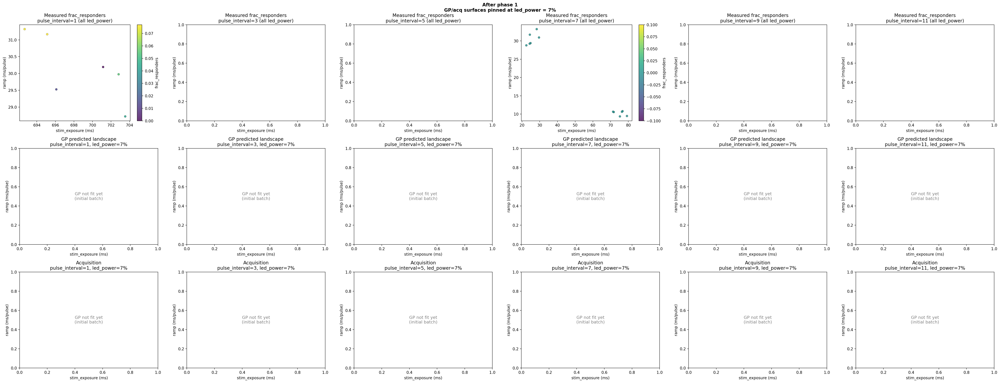


=== ComposedAgent: phase 2/13 ===
[FOVFinderAgent] Phase 1 — selected FOVs:
    B12_0000: 132 cells  cnr(mean=0.679, 77% below 0.9)
    B12_0001: 233 cells  cnr(mean=0.578, 89% below 0.9)
    B12_0002: 58 cells  cnr(mean=0.776, 66% below 0.9) (below min_cells)
    B11_0000: 132 cells  cnr(mean=0.875, 52% below 0.9) (below min_cells)
    B11_0001: 123 cells  cnr(mean=0.866, 55% below 0.9) (below min_cells)
    B11_0002: 106 cells  cnr(mean=0.707, 73% below 0.9) (below min_cells)
    B10_0000: 136 cells  cnr(mean=0.708, 76% below 0.9)
    B10_0001: 165 cells  cnr(mean=0.707, 76% below 0.9)
    B10_0002: 104 cells  cnr(mean=0.800, 66% below 0.9) (below min_cells)
    B9_0000: 134 cells  cnr(mean=0.625, 86% below 0.9)
    B9_0001: 150 cells  cnr(mean=0.678, 81% below 0.9)
    B9_0002: 177 cells  cnr(mean=0.732, 72% below 0.9) (below min_cells)
    B8_0000: 97 cells  cnr(mean=0.675, 77% below 0.9)
    B8_0001: 188 cells  cnr(mean=0.612, 89% below 0.9)
    B8_0002: 140 cells  cnr(mean=0.780

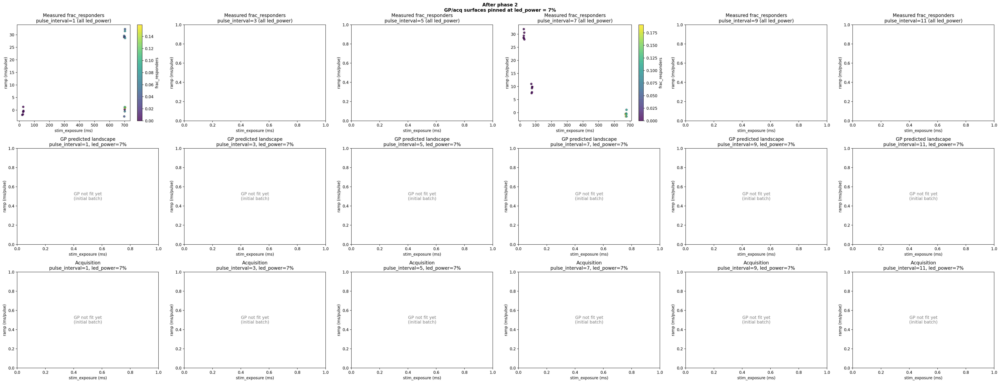


=== ComposedAgent: phase 3/13 ===
[FOVFinderAgent] Phase 2 — selected FOVs:
    B6_0000: 55 cells  cnr(mean=0.760, 78% below 0.9)
    B6_0001: 89 cells  cnr(mean=0.767, 72% below 0.9) (below min_cells)
    B6_0002: 81 cells  cnr(mean=0.729, 69% below 0.9) (below min_cells)
    B5_0000: 129 cells  cnr(mean=0.651, 81% below 0.9)
    B5_0001: 140 cells  cnr(mean=0.703, 76% below 0.9)
    B5_0002: 180 cells  cnr(mean=0.673, 84% below 0.9)
    B4_0000: 167 cells  cnr(mean=0.669, 78% below 0.9)
    B4_0001: 199 cells  cnr(mean=0.667, 81% below 0.9)
    B4_0002: 109 cells  cnr(mean=0.852, 57% below 0.9) (below min_cells)
    B3_0000: 125 cells  cnr(mean=0.739, 68% below 0.9) (below min_cells)
    B3_0001: 110 cells  cnr(mean=0.803, 66% below 0.9) (below min_cells)
    B3_0002: 70 cells  cnr(mean=0.884, 40% below 0.9) (below min_cells)
    B2_0000: 185 cells  cnr(mean=0.651, 84% below 0.9)
    B2_0001: 74 cells  cnr(mean=0.799, 64% below 0.9) (below min_cells)
    B2_0002: 47 cells  cnr(mean=

sample: 100%|##########| 1200/1200 [00:03<00:00, 359.80it/s, 7 steps of size 5.78e-01. acc. prob=0.86]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      0.72      0.80      0.53      0.05      1.30    433.15      1.00
k_length[1]      1.19      1.39      0.80      0.06      2.44    686.52      1.00
k_length[2]      1.92      2.51      1.08      0.04      4.34    477.38      1.00
k_length[3]      2.50      2.91      1.66      0.07      5.47    812.75      1.00
k_length[4]      3.70      3.12      2.83      0.62      6.68    552.24      1.00
k_length[5]      1.98      1.01      1.80      0.58      3.31    747.42      1.00
k_length[6]      4.17      2.81      3.63      0.99      7.02    563.60      1.00
    k_scale      0.83      0.33      0.76      0.35      1.26    854.50      1.00
      noise      0.15      0.07      0.13      0.04      0.24    979.67      1.00

Computing robust acquisition over 230304 scenarios (14394 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 1.047194
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.062342
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14392 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 1.036914
  Robust acq stats: min=0.000000, max=0.058769
=== Phase 2: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(700), 'ramp': np.int64(0), 'pulse_interval': np.int64(7), 'led_power': np.int64(10)}
  Condition 1: {'stim_exposure': np.int64(700), 'ramp': np.int64(0), 'pulse_interval': np.int64(7), 'led_power': np.int64(60)}
  Condition 2: {'stim_exposure': np.int64(675), 'ramp': np.int64(0), 'pulse_interval': np.int64(11), 'led_power': np.int64(10)}


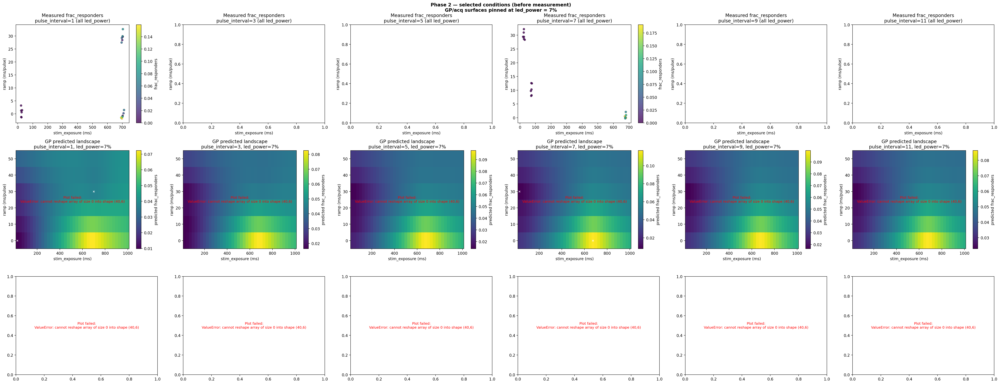

  Created 1620 events for phase 2
    Cond 0 (FOVs 36-41): stim_exposure=700ms, ramp=0ms/pulse, pulse_interval=7 frames, led_power=10%, n_pulses=9 (final exposure clipped at 5000ms: 700ms)
    Cond 1 (FOVs 42-47): stim_exposure=700ms, ramp=0ms/pulse, pulse_interval=7 frames, led_power=60%, n_pulses=9 (final exposure clipped at 5000ms: 700ms)
    Cond 2 (FOVs 48-53): stim_exposure=675ms, ramp=0ms/pulse, pulse_interval=11 frames, led_power=10%, n_pulses=6 (final exposure clipped at 5000ms: 675ms)
  Recovered optoRTK for FOV 53 after 1.0 s re-read (119 cells, mean=1744.919)
  Phase 2: 18 FOVs, mean frac_oscillating=0.9996, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


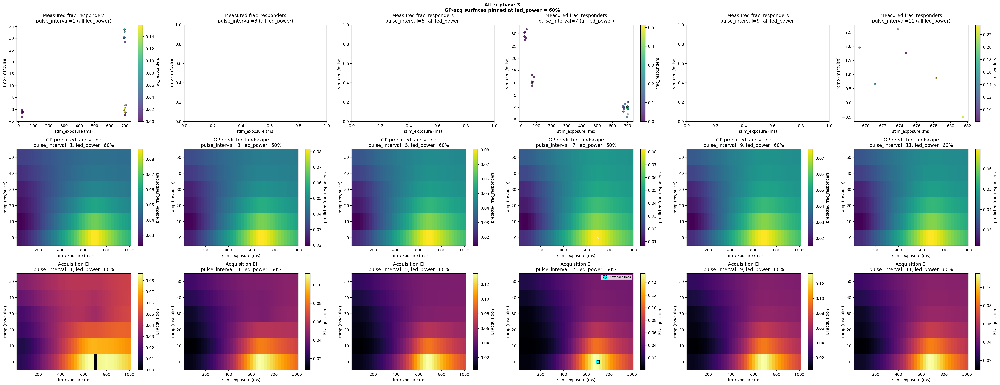


=== ComposedAgent: phase 4/13 ===
[FOVFinderAgent] Phase 3 — selected FOVs:
    C3_0000: 102 cells  cnr(mean=0.692, 81% below 0.9)
    C3_0001: 91 cells  cnr(mean=0.841, 55% below 0.9) (below min_cells)
    C3_0002: 88 cells  cnr(mean=0.811, 57% below 0.9) (below min_cells)
    C4_0000: 198 cells  cnr(mean=0.621, 89% below 0.9)
    C4_0001: 138 cells  cnr(mean=0.724, 73% below 0.9) (below min_cells)
    C4_0002: 102 cells  cnr(mean=0.753, 66% below 0.9) (below min_cells)
    C5_0000: 189 cells  cnr(mean=0.627, 88% below 0.9)
    C5_0001: 104 cells  cnr(mean=0.785, 61% below 0.9) (below min_cells)
    C5_0002: 91 cells  cnr(mean=0.796, 59% below 0.9) (below min_cells)
    C6_0000: 145 cells  cnr(mean=0.535, 92% below 0.9)
    C6_0001: 152 cells  cnr(mean=0.650, 83% below 0.9)
    C6_0002: 107 cells  cnr(mean=0.791, 62% below 0.9) (below min_cells)
    C7_0000: 124 cells  cnr(mean=0.723, 75% below 0.9) (below min_cells)
    C7_0001: 123 cells  cnr(mean=0.704, 74% below 0.9) (below min_c

sample: 100%|##########| 1200/1200 [00:04<00:00, 294.18it/s, 7 steps of size 4.23e-01. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      0.58      0.47      0.47      0.06      1.06    837.73      1.00
k_length[1]      2.21      2.88      1.45      0.03      4.57    605.89      1.00
k_length[2]      0.63      0.37      0.58      0.09      1.11    688.41      1.00
k_length[3]      3.12      2.16      2.72      0.54      5.65    720.07      1.00
k_length[4]      2.27      1.39      1.94      0.87      3.55    259.57      1.00
k_length[5]      2.66      2.37      2.10      0.83      4.38    354.07      1.00
k_length[6]      2.96      2.12      2.28      0.86      5.34    444.21      1.00
    k_scale      0.80      0.28      0.74      0.37      1.17    746.63      1.00
      noise      0.10      0.05      0.09      0.03      0.17    414.99      1.00

Computing robust acquisition over 230256 scenarios (14391 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 1.095525
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.051615
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14389 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 1.095525
  Robust acq stats: min=0.000000, max=0.046852
=== Phase 3: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(750), 'ramp': np.int64(0), 'pulse_interval': np.int64(7), 'led_power': np.int64(40)}
  Condition 1: {'stim_exposure': np.int64(750), 'ramp': np.int64(30), 'pulse_interval': np.int64(7), 'led_power': np.int64(50)}
  Condition 2: {'stim_exposure': np.int64(750), 'ramp': np.int64(10), 'pulse_interval': np.int64(7), 'led_power': np.int64(50)}


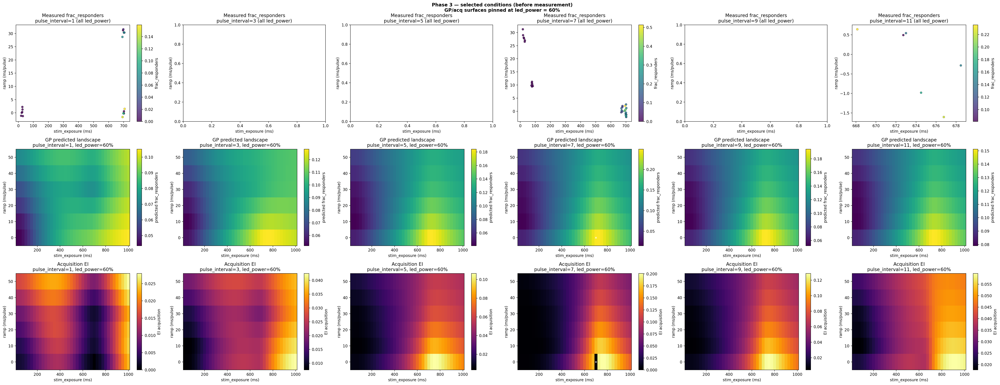

  Created 1620 events for phase 3
    Cond 0 (FOVs 54-59): stim_exposure=750ms, ramp=0ms/pulse, pulse_interval=7 frames, led_power=40%, n_pulses=9 (final exposure clipped at 5000ms: 750ms)
    Cond 1 (FOVs 60-65): stim_exposure=750ms, ramp=30ms/pulse, pulse_interval=7 frames, led_power=50%, n_pulses=9 (final exposure clipped at 5000ms: 990ms)
    Cond 2 (FOVs 66-71): stim_exposure=750ms, ramp=10ms/pulse, pulse_interval=7 frames, led_power=50%, n_pulses=9 (final exposure clipped at 5000ms: 830ms)
  Recovered optoRTK for FOV 71 after 1.0 s re-read (124 cells, mean=1368.494)
  Phase 3: 18 FOVs, mean frac_oscillating=1.0000, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


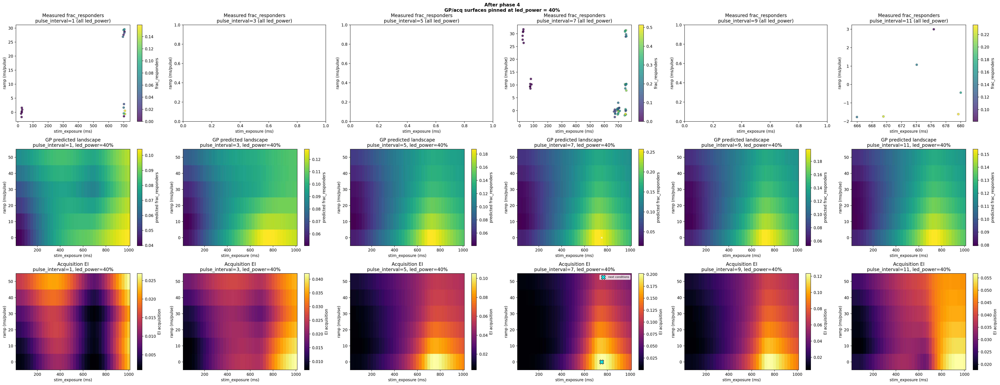


=== ComposedAgent: phase 5/13 ===
[FOVFinderAgent] Phase 4 — selected FOVs:
    C9_0000: 131 cells  cnr(mean=0.693, 83% below 0.9)
    C9_0001: 198 cells  cnr(mean=0.624, 87% below 0.9)
    C9_0002: 209 cells  cnr(mean=0.580, 93% below 0.9)
    C10_0000: 95 cells  cnr(mean=0.677, 77% below 0.9)
    C10_0001: 120 cells  cnr(mean=0.719, 77% below 0.9)
    C10_0002: 196 cells  cnr(mean=0.588, 89% below 0.9)
    C11_0000: 81 cells  cnr(mean=0.715, 81% below 0.9)
    C11_0001: 171 cells  cnr(mean=0.680, 82% below 0.9)
    C11_0002: 111 cells  cnr(mean=0.715, 74% below 0.9) (below min_cells)
    C12_0000: 227 cells  cnr(mean=0.549, 95% below 0.9)
    C12_0001: 139 cells  cnr(mean=0.706, 72% below 0.9) (below min_cells)
    C12_0002: 62 cells  cnr(mean=0.801, 67% below 0.9) (below min_cells)
    D12_0000: 41 cells  cnr(mean=0.683, 78% below 0.9)
    D12_0001: 60 cells  cnr(mean=0.718, 68% below 0.9) (below min_cells)
    D12_0002: 60 cells  cnr(mean=0.810, 66% below 0.9) (below min_cells)
  

sample: 100%|##########| 1200/1200 [00:04<00:00, 286.00it/s, 7 steps of size 5.14e-01. acc. prob=0.90]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      0.60      0.30      0.56      0.19      1.02    895.31      1.00
k_length[1]      3.05      2.51      2.30      0.67      5.87    779.40      1.00
k_length[2]      0.49      0.27      0.45      0.09      0.89    726.42      1.00
k_length[3]      3.04      2.17      2.59      0.29      5.34    900.82      1.00
k_length[4]      3.62      2.79      2.96      1.31      5.65    186.61      1.00
k_length[5]      2.93      0.91      2.81      1.58      4.32    715.93      1.00
k_length[6]      4.90      3.85      3.79      1.25      8.55    650.48      1.00
    k_scale      0.79      0.27      0.75      0.42      1.20    680.02      1.00
      noise      0.13      0.03      0.13      0.08      0.18    734.18      1.00

Computing robust acquisition over 230208 scenarios (14388 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 1.180735
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.055393
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14386 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 1.180735
  Robust acq stats: min=0.000000, max=0.045616
=== Phase 4: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(825), 'ramp': np.int64(20), 'pulse_interval': np.int64(7), 'led_power': np.int64(50)}
  Condition 1: {'stim_exposure': np.int64(825), 'ramp': np.int64(30), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}
  Condition 2: {'stim_exposure': np.int64(800), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}


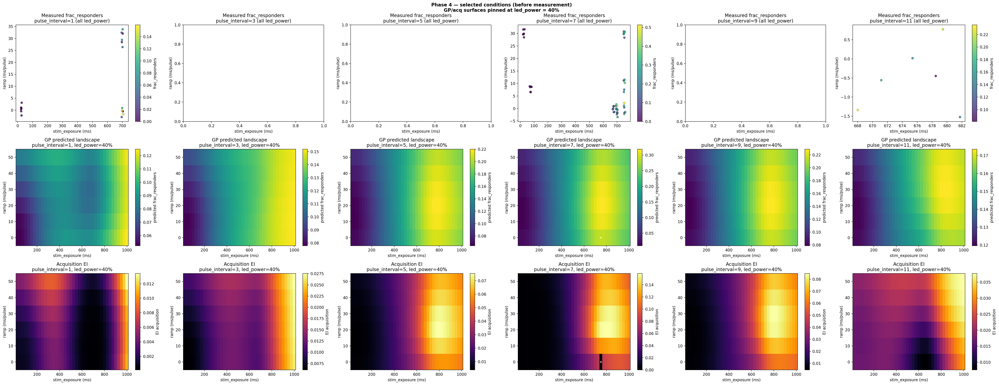

  Created 1620 events for phase 4
    Cond 0 (FOVs 72-77): stim_exposure=825ms, ramp=20ms/pulse, pulse_interval=7 frames, led_power=50%, n_pulses=9 (final exposure clipped at 5000ms: 985ms)
    Cond 1 (FOVs 78-83): stim_exposure=825ms, ramp=30ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1065ms)
    Cond 2 (FOVs 84-89): stim_exposure=800ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1200ms)
  Recovered optoRTK for FOV 89 after 1.0 s re-read (99 cells, mean=1626.190)
  Phase 4: 18 FOVs, mean frac_oscillating=0.9972, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


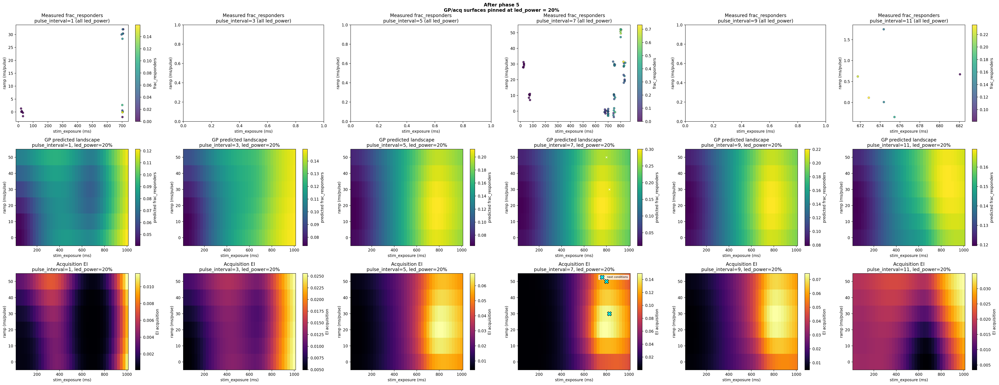


=== ComposedAgent: phase 6/13 ===
[FOVFinderAgent] Phase 5 — selected FOVs:
    D10_0000: 59 cells  cnr(mean=0.687, 86% below 0.9)
    D10_0001: 96 cells  cnr(mean=0.756, 76% below 0.9)
    D10_0002: 162 cells  cnr(mean=0.610, 89% below 0.9)
    D9_0000: 119 cells  cnr(mean=0.702, 78% below 0.9)
    D9_0001: 123 cells  cnr(mean=0.710, 73% below 0.9) (below min_cells)
    D9_0002: 99 cells  cnr(mean=0.726, 71% below 0.9) (below min_cells)
    D8_0000: 58 cells  cnr(mean=0.708, 76% below 0.9)
    D8_0001: 145 cells  cnr(mean=0.624, 90% below 0.9)
    D8_0002: 191 cells  cnr(mean=0.570, 90% below 0.9)
    D7_0000: 54 cells  cnr(mean=0.766, 75% below 0.9)
    D7_0001: 138 cells  cnr(mean=0.615, 88% below 0.9)
    D7_0002: 189 cells  cnr(mean=0.576, 91% below 0.9)
    D6_0000: 79 cells  cnr(mean=0.721, 79% below 0.9)
    D6_0001: 131 cells  cnr(mean=0.688, 77% below 0.9)
    D6_0002: 196 cells  cnr(mean=0.607, 85% below 0.9)
    D5_0000: 47 cells  cnr(mean=0.724, 82% below 0.9)
    D5_0001

sample: 100%|##########| 1200/1200 [00:05<00:00, 223.08it/s, 7 steps of size 4.71e-01. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      0.80      0.29      0.77      0.35      1.27    815.46      1.00
k_length[1]      3.87      1.95      3.52      1.30      6.36    729.45      1.00
k_length[2]      0.46      0.25      0.42      0.07      0.81    837.35      1.00
k_length[3]      3.42      2.05      2.87      0.98      5.97    962.57      1.00
k_length[4]      3.82      1.52      3.53      1.96      5.75    335.23      1.00
k_length[5]      3.11      0.86      3.03      1.83      4.42    576.14      1.00
k_length[6]      7.52      5.20      6.04      2.41     13.44    726.49      1.00
    k_scale      0.86      0.30      0.80      0.42      1.30    506.87      1.00
      noise      0.09      0.02      0.09      0.06      0.12    790.42      1.00

Computing robust acquisition over 230160 scenarios (14385 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 1.384910
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.082874
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14383 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 1.384910
  Robust acq stats: min=0.000000, max=0.080637
=== Phase 5: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(825), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}
  Condition 1: {'stim_exposure': np.int64(775), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}
  Condition 2: {'stim_exposure': np.int64(800), 'ramp': np.int64(40), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}


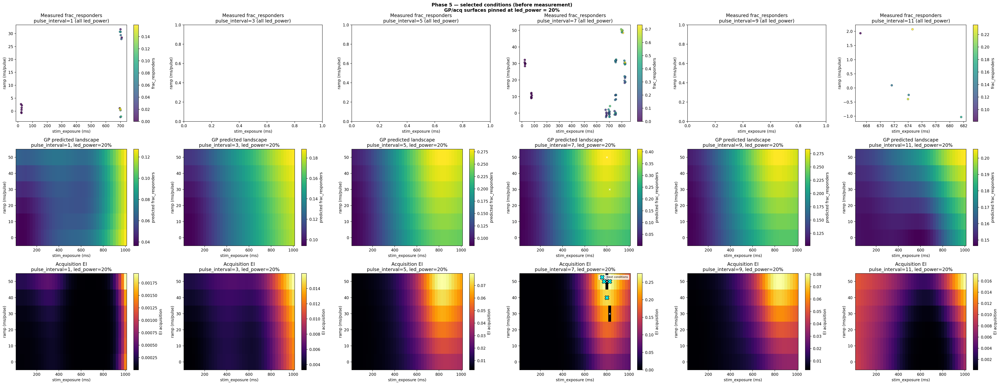

  Created 1620 events for phase 5
    Cond 0 (FOVs 90-95): stim_exposure=825ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1225ms)
    Cond 1 (FOVs 96-101): stim_exposure=775ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1175ms)
    Cond 2 (FOVs 102-107): stim_exposure=800ms, ramp=40ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1120ms)
  Recovered optoRTK for FOV 107 after 1.0 s re-read (186 cells, mean=1271.994)
  Phase 5: 18 FOVs, mean frac_oscillating=0.9991, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


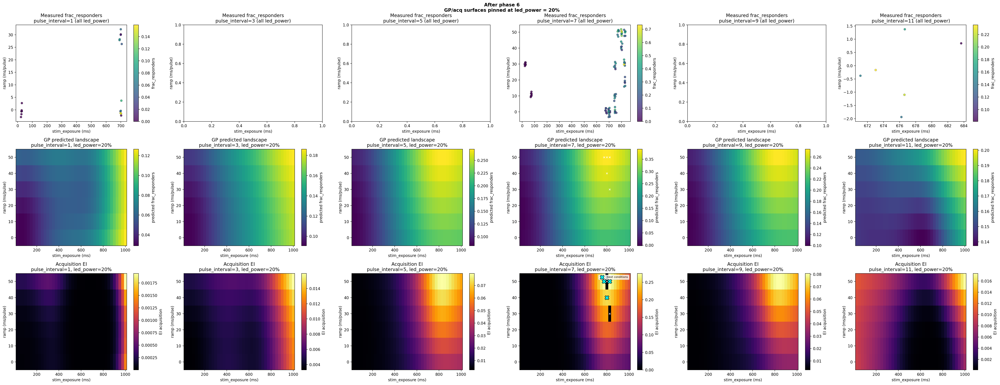


=== ComposedAgent: phase 7/13 ===


C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\segmentation\cellpose_v4.py:43: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  masks = skimage.morphology.remove_small_objects(


[FOVFinderAgent] Phase 6 — selected FOVs:
    D4_0000: 60 cells  cnr(mean=0.713, 75% below 0.9)
    D4_0001: 121 cells  cnr(mean=0.631, 86% below 0.9)
    D4_0002: 187 cells  cnr(mean=0.587, 92% below 0.9)
    D3_0000: 67 cells  cnr(mean=0.679, 79% below 0.9)
    D3_0001: 131 cells  cnr(mean=0.666, 76% below 0.9)
    D3_0002: 244 cells  cnr(mean=0.623, 87% below 0.9)
    D2_0000: 35 cells  cnr(mean=0.661, 77% below 0.9)
    D2_0001: 225 cells  cnr(mean=0.617, 89% below 0.9)
    D2_0002: 84 cells  cnr(mean=0.782, 66% below 0.9) (below min_cells)
    E2_0000: 105 cells  cnr(mean=0.651, 83% below 0.9)
    E2_0001: 67 cells  cnr(mean=0.798, 67% below 0.9) (below min_cells)
    E2_0002: 51 cells  cnr(mean=0.867, 56% below 0.9) (below min_cells)
    E3_0000: 85 cells  cnr(mean=0.720, 77% below 0.9)
    E3_0001: 88 cells  cnr(mean=0.765, 65% below 0.9) (below min_cells)
    E3_0002: 77 cells  cnr(mean=0.746, 73% below 0.9) (below min_cells)
    E4_0000: 50 cells  cnr(mean=0.723, 84% below 0.9

sample: 100%|##########| 1200/1200 [00:06<00:00, 185.96it/s, 7 steps of size 5.16e-01. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      0.75      0.31      0.71      0.28      1.23    917.06      1.00
k_length[1]      2.99      1.59      2.63      0.99      5.16    647.13      1.00
k_length[2]      0.49      0.28      0.45      0.10      0.92   1351.62      1.00
k_length[3]      4.23      2.59      3.56      0.91      7.70   1052.00      1.00
k_length[4]      5.33      2.73      4.65      2.04      8.30    282.80      1.01
k_length[5]      3.02      0.96      2.93      1.26      4.36    718.62      1.00
k_length[6]      7.76      6.17      6.19      2.59     13.50    569.59      1.01
    k_scale      0.91      0.31      0.85      0.48      1.39    523.19      1.00
      noise      0.14      0.02      0.13      0.09      0.17    846.52      1.00

Computing robust acquisition over 230112 scenarios (14382 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 0.854667
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.070506
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14380 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 0.854667
  Robust acq stats: min=0.000000, max=0.069144
=== Phase 6: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(800), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(40)}
  Condition 1: {'stim_exposure': np.int64(750), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}
  Condition 2: {'stim_exposure': np.int64(850), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}


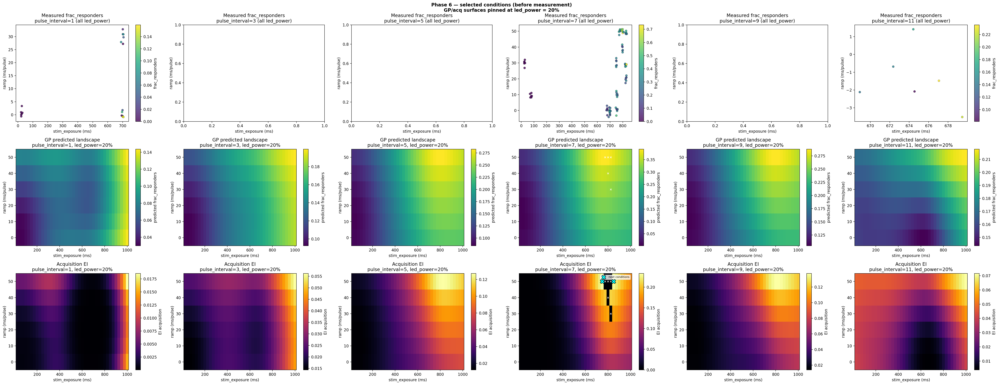

  Created 1620 events for phase 6
    Cond 0 (FOVs 108-113): stim_exposure=800ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=40%, n_pulses=9 (final exposure clipped at 5000ms: 1200ms)
    Cond 1 (FOVs 114-119): stim_exposure=750ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1150ms)
    Cond 2 (FOVs 120-125): stim_exposure=850ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1250ms)
  Recovered optoRTK for FOV 125 after 1.0 s re-read (107 cells, mean=1310.872)
  Phase 6: 18 FOVs, mean frac_oscillating=0.9997, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


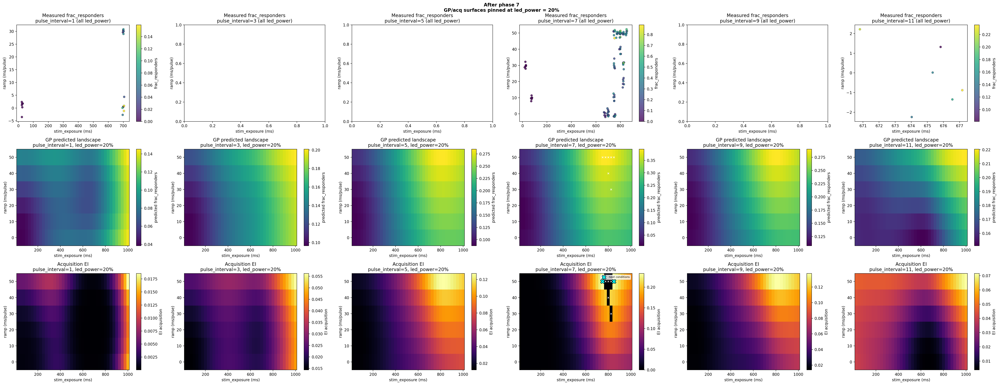


=== ComposedAgent: phase 8/13 ===
[FOVFinderAgent] Phase 7 — selected FOVs:
    E5_0000: 71 cells  cnr(mean=0.679, 81% below 0.9)
    E5_0001: 91 cells  cnr(mean=0.693, 82% below 0.9)
    E5_0002: 154 cells  cnr(mean=0.544, 90% below 0.9)
    E6_0000: 88 cells  cnr(mean=0.635, 76% below 0.9)
    E6_0001: 154 cells  cnr(mean=0.601, 86% below 0.9)
    E6_0002: 173 cells  cnr(mean=0.582, 89% below 0.9)
    E7_0000: 70 cells  cnr(mean=0.689, 84% below 0.9)
    E7_0001: 109 cells  cnr(mean=0.688, 80% below 0.9)
    E7_0002: 157 cells  cnr(mean=0.538, 92% below 0.9)
    E8_0000: 74 cells  cnr(mean=0.653, 82% below 0.9)
    E8_0001: 101 cells  cnr(mean=0.668, 84% below 0.9)
    E8_0002: 125 cells  cnr(mean=0.632, 86% below 0.9)
    E9_0000: 64 cells  cnr(mean=0.700, 78% below 0.9)
    E9_0001: 145 cells  cnr(mean=0.627, 82% below 0.9)
    E9_0002: 192 cells  cnr(mean=0.536, 97% below 0.9)
    E10_0000: 44 cells  cnr(mean=0.733, 77% below 0.9)
    E10_0001: 105 cells  cnr(mean=0.659, 85% belo

sample: 100%|##########| 1200/1200 [00:07<00:00, 161.29it/s, 7 steps of size 6.26e-01. acc. prob=0.85]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      0.83      0.30      0.80      0.38      1.29    940.59      1.00
k_length[1]      3.23      1.64      2.86      1.02      5.31    723.20      1.00
k_length[2]      0.51      0.29      0.46      0.11      0.92    963.56      1.00
k_length[3]      5.02      3.05      4.28      1.26      8.89    840.25      1.00
k_length[4]      6.77      3.72      5.94      2.50     10.42    243.98      1.00
k_length[5]      3.59      1.00      3.50      2.00      5.04    827.88      1.00
k_length[6]      5.51      3.06      4.74      2.24      9.28    768.75      1.00
    k_scale      0.92      0.34      0.86      0.46      1.45    850.14      1.00
      noise      0.15      0.02      0.14      0.11      0.18    937.33      1.00

Computing robust acquisition over 230064 scenarios (14379 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 0.926291
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.044651
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14377 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 0.925974
  Robust acq stats: min=0.000000, max=0.043244
=== Phase 7: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(750), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(50)}
  Condition 1: {'stim_exposure': np.int64(725), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}
  Condition 2: {'stim_exposure': np.int64(700), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}


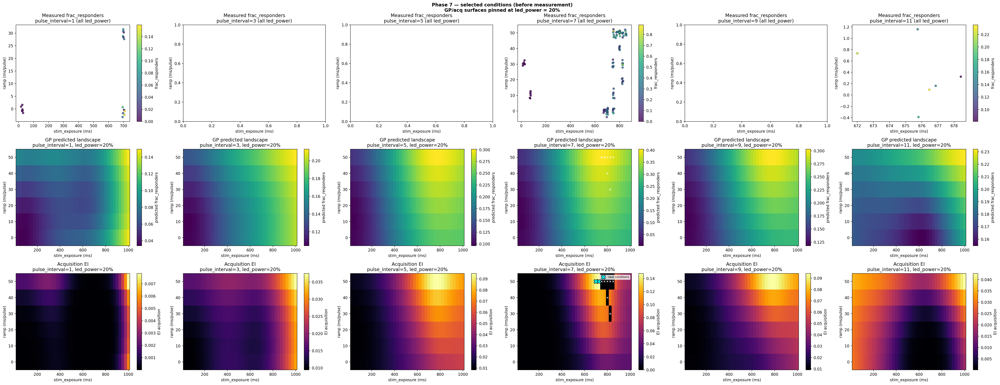

  Created 1620 events for phase 7
    Cond 0 (FOVs 126-131): stim_exposure=750ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=50%, n_pulses=9 (final exposure clipped at 5000ms: 1150ms)
    Cond 1 (FOVs 132-137): stim_exposure=725ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1125ms)
    Cond 2 (FOVs 138-143): stim_exposure=700ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1100ms)
  Recovered optoRTK for FOV 143 after 1.0 s re-read (150 cells, mean=1349.115)
  Phase 7: 18 FOVs, mean frac_oscillating=1.0000, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


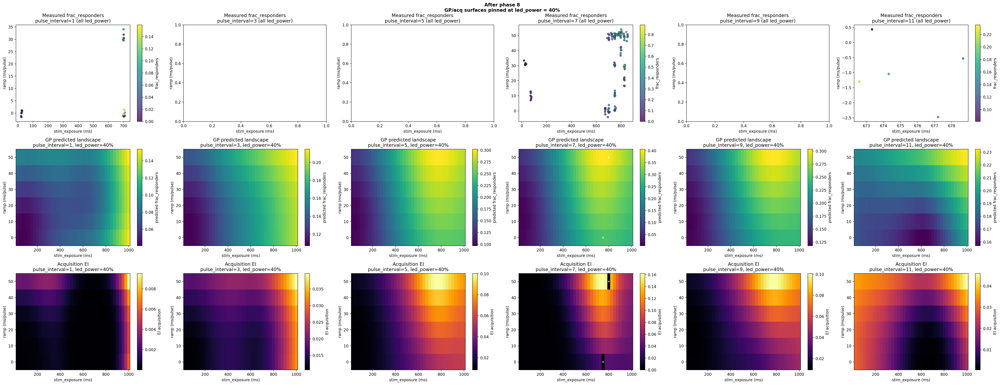


=== ComposedAgent: phase 9/13 ===
[FOVFinderAgent] Phase 8 — selected FOVs:
    E11_0000: 52 cells  cnr(mean=0.654, 84% below 0.9)
    E11_0001: 69 cells  cnr(mean=0.704, 78% below 0.9)
    E11_0002: 130 cells  cnr(mean=0.575, 91% below 0.9)
    E12_0000: 51 cells  cnr(mean=0.695, 80% below 0.9)
    E12_0001: 73 cells  cnr(mean=0.677, 82% below 0.9)
    E12_0002: 80 cells  cnr(mean=0.688, 78% below 0.9)
    F12_0000: 41 cells  cnr(mean=0.723, 80% below 0.9)
    F12_0001: 101 cells  cnr(mean=0.704, 73% below 0.9) (below min_cells)
    F12_0002: 60 cells  cnr(mean=0.767, 66% below 0.9) (below min_cells)
    F11_0000: 40 cells  cnr(mean=0.668, 76% below 0.9)
    F11_0001: 69 cells  cnr(mean=0.649, 84% below 0.9)
    F11_0002: 124 cells  cnr(mean=0.584, 88% below 0.9)
    F10_0000: 56 cells  cnr(mean=0.658, 80% below 0.9)
    F10_0001: 83 cells  cnr(mean=0.620, 86% below 0.9)
    F10_0002: 169 cells  cnr(mean=0.582, 92% below 0.9)
    F9_0000: 51 cells  cnr(mean=0.664, 80% below 0.9)
    

sample: 100%|##########| 1200/1200 [00:08<00:00, 133.39it/s, 7 steps of size 5.62e-01. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      0.50      0.26      0.43      0.17      0.86    628.94      1.00
k_length[1]      3.36      2.00      2.85      1.19      6.23    707.81      1.00
k_length[2]      0.56      0.35      0.50      0.04      1.04   1115.21      1.00
k_length[3]      4.54      3.34      3.59      0.73      8.75    639.39      1.00
k_length[4]      7.07      4.35      6.04      2.46     11.34    314.91      1.00
k_length[5]      3.61      1.02      3.54      2.14      5.26    709.62      1.00
k_length[6]      7.23      4.66      5.90      2.46     12.71    755.48      1.00
    k_scale      0.99      0.35      0.91      0.49      1.47    712.51      1.00
      noise      0.17      0.03      0.16      0.13      0.21    620.17      1.00

Computing robust acquisition over 230016 scenarios (14376 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 0.769371
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.069228
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14374 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 0.755345
  Robust acq stats: min=0.000000, max=0.056626
=== Phase 8: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(800), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(30)}
  Condition 1: {'stim_exposure': np.int64(800), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(10)}
  Condition 2: {'stim_exposure': np.int64(800), 'ramp': np.int64(30), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}


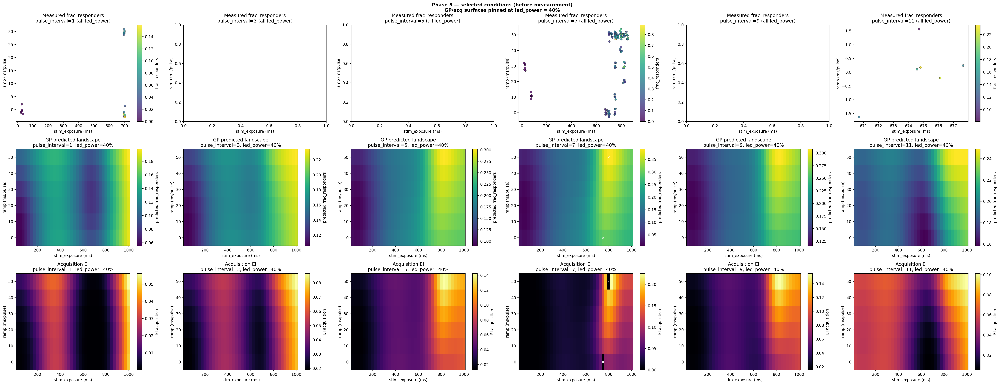

  Created 1620 events for phase 8
    Cond 0 (FOVs 144-149): stim_exposure=800ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=30%, n_pulses=9 (final exposure clipped at 5000ms: 1200ms)
    Cond 1 (FOVs 150-155): stim_exposure=800ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=10%, n_pulses=9 (final exposure clipped at 5000ms: 1200ms)
    Cond 2 (FOVs 156-161): stim_exposure=800ms, ramp=30ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1040ms)
  Recovered optoRTK for FOV 161 after 1.0 s re-read (114 cells, mean=1149.575)
  Phase 8: 18 FOVs, mean frac_oscillating=1.0000, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


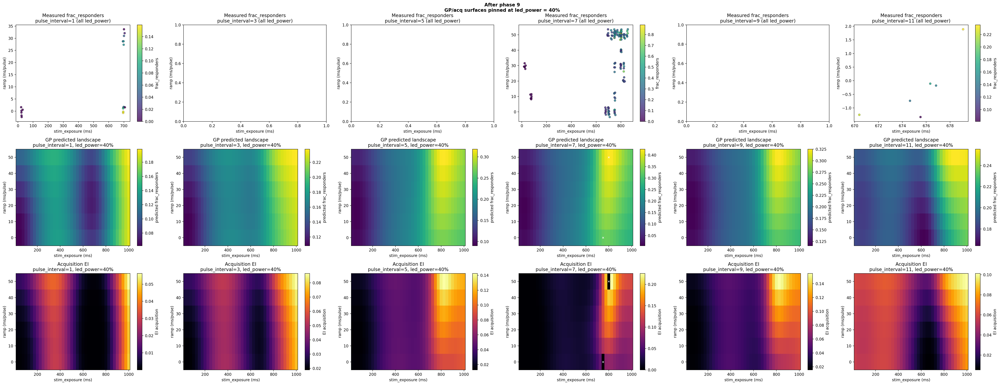


=== ComposedAgent: phase 10/13 ===
[FOVFinderAgent] Phase 9 — selected FOVs:
    F8_0000: 54 cells  cnr(mean=0.689, 81% below 0.9)
    F8_0001: 130 cells  cnr(mean=0.603, 90% below 0.9)
    F8_0002: 188 cells  cnr(mean=0.560, 93% below 0.9)
    F7_0000: 58 cells  cnr(mean=0.723, 77% below 0.9)
    F7_0001: 88 cells  cnr(mean=0.595, 82% below 0.9)
    F7_0002: 232 cells  cnr(mean=0.583, 93% below 0.9)
    F6_0000: 49 cells  cnr(mean=0.697, 76% below 0.9)
    F6_0001: 73 cells  cnr(mean=0.606, 87% below 0.9)
    F6_0002: 118 cells  cnr(mean=0.596, 92% below 0.9)
    F5_0000: 101 cells  cnr(mean=0.577, 89% below 0.9)
    F5_0001: 140 cells  cnr(mean=0.619, 86% below 0.9)
    F5_0002: 171 cells  cnr(mean=0.503, 97% below 0.9)
    F4_0000: 36 cells  cnr(mean=0.619, 88% below 0.9)
    F4_0001: 94 cells  cnr(mean=0.592, 91% below 0.9)
    F4_0002: 182 cells  cnr(mean=0.597, 91% below 0.9)
    F3_0000: 57 cells  cnr(mean=0.663, 93% below 0.9)
    F3_0001: 115 cells  cnr(mean=0.638, 88% below 

sample: 100%|##########| 1200/1200 [00:12<00:00, 94.18it/s, 3 steps of size 5.08e-01. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      0.89      0.37      0.86      0.30      1.40    921.68      1.00
k_length[1]      3.80      2.33      3.29      1.14      6.64    609.57      1.00
k_length[2]      0.54      0.32      0.47      0.05      0.98    831.16      1.00
k_length[3]      4.73      3.58      3.87      0.33      8.67    500.98      1.00
k_length[4]      8.98      6.08      7.41      2.54     16.02    283.74      1.01
k_length[5]      3.90      1.10      3.80      2.03      5.49    594.04      1.00
k_length[6]      7.07      4.36      5.91      2.66     11.96    648.05      1.00
    k_scale      1.03      0.37      0.97      0.48      1.55    487.50      1.00
      noise      0.23      0.03      0.23      0.18      0.27    461.82      1.00

Computing robust acquisition over 229968 scenarios (14373 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 0.422499
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.064432
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14371 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 0.422499
  Robust acq stats: min=0.000000, max=0.061189
=== Phase 9: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(1000), 'ramp': np.int64(50), 'pulse_interval': np.int64(7), 'led_power': np.int64(100)}
  Condition 1: {'stim_exposure': np.int64(1000), 'ramp': np.int64(30), 'pulse_interval': np.int64(5), 'led_power': np.int64(20)}
  Condition 2: {'stim_exposure': np.int64(1000), 'ramp': np.int64(30), 'pulse_interval': np.int64(9), 'led_power': np.int64(20)}


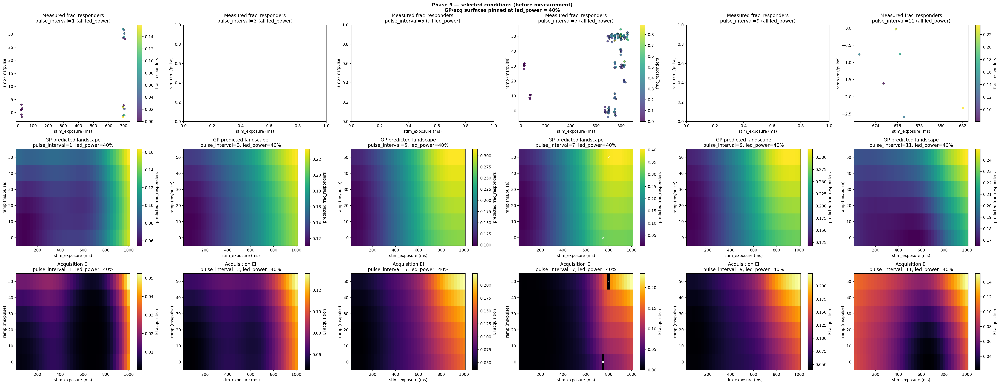

  Created 1620 events for phase 9
    Cond 0 (FOVs 162-167): stim_exposure=1000ms, ramp=50ms/pulse, pulse_interval=7 frames, led_power=100%, n_pulses=9 (final exposure clipped at 5000ms: 1400ms)
    Cond 1 (FOVs 168-173): stim_exposure=1000ms, ramp=30ms/pulse, pulse_interval=5 frames, led_power=20%, n_pulses=12 (final exposure clipped at 5000ms: 1330ms)
    Cond 2 (FOVs 174-179): stim_exposure=1000ms, ramp=30ms/pulse, pulse_interval=9 frames, led_power=20%, n_pulses=7 (final exposure clipped at 5000ms: 1180ms)
  Recovered optoRTK for FOV 179 after 1.0 s re-read (181 cells, mean=1342.193)
  Phase 9: 18 FOVs, mean frac_oscillating=0.9991, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


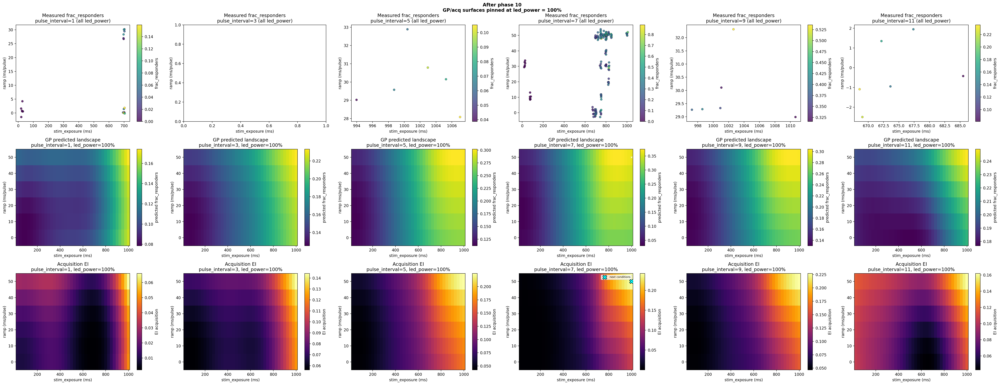


=== ComposedAgent: phase 11/13 ===
[FOVFinderAgent] Phase 10 — selected FOVs:
    F2_0000: 46 cells  cnr(mean=0.734, 77% below 0.9)
    F2_0001: 104 cells  cnr(mean=0.618, 92% below 0.9)
    F2_0002: 144 cells  cnr(mean=0.574, 93% below 0.9)
    G2_0000: 54 cells  cnr(mean=0.662, 84% below 0.9)
    G2_0001: 146 cells  cnr(mean=0.601, 87% below 0.9)
    G2_0002: 59 cells  cnr(mean=0.786, 63% below 0.9) (below min_cells)
    G3_0000: 38 cells  cnr(mean=0.751, 76% below 0.9)
    G3_0001: 88 cells  cnr(mean=0.713, 76% below 0.9)
    G3_0002: 184 cells  cnr(mean=0.594, 92% below 0.9)
    G4_0000: 39 cells  cnr(mean=0.721, 79% below 0.9)
    G4_0001: 72 cells  cnr(mean=0.691, 81% below 0.9)
    G4_0002: 159 cells  cnr(mean=0.572, 96% below 0.9)
    G5_0000: 48 cells  cnr(mean=0.734, 75% below 0.9)
    G5_0001: 85 cells  cnr(mean=0.645, 76% below 0.9)
    G5_0002: 236 cells  cnr(mean=0.572, 93% below 0.9)
    G6_0000: 35 cells  cnr(mean=0.633, 79% below 0.9)
    G6_0001: 71 cells  cnr(mean=0

sample: 100%|##########| 1200/1200 [00:15<00:00, 75.40it/s, 7 steps of size 5.45e-01. acc. prob=0.90]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      1.11      0.39      1.06      0.52      1.68    796.89      1.00
k_length[1]      3.88      2.27      3.36      1.12      6.65    602.57      1.00
k_length[2]      0.64      0.30      0.62      0.15      1.10    923.82      1.00
k_length[3]      5.85      3.99      4.72      1.23     10.49    909.28      1.00
k_length[4]      9.60      6.55      7.91      3.18     16.61    370.45      1.00
k_length[5]      4.11      1.10      3.96      2.40      5.97    707.93      1.00
k_length[6]      7.31      4.29      6.06      2.29     12.36    623.94      1.00
    k_scale      1.05      0.37      0.98      0.53      1.56    516.39      1.00
      noise      0.22      0.03      0.22      0.17      0.26    821.70      1.00

Computing robust acquisition over 229920 scenarios (14370 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 0.916650
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.052941
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14368 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 0.916650
  Robust acq stats: min=0.000000, max=0.051166
=== Phase 10: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(1000), 'ramp': np.int64(50), 'pulse_interval': np.int64(9), 'led_power': np.int64(100)}
  Condition 1: {'stim_exposure': np.int64(1000), 'ramp': np.int64(30), 'pulse_interval': np.int64(7), 'led_power': np.int64(20)}
  Condition 2: {'stim_exposure': np.int64(1000), 'ramp': np.int64(40), 'pulse_interval': np.int64(9), 'led_power': np.int64(100)}


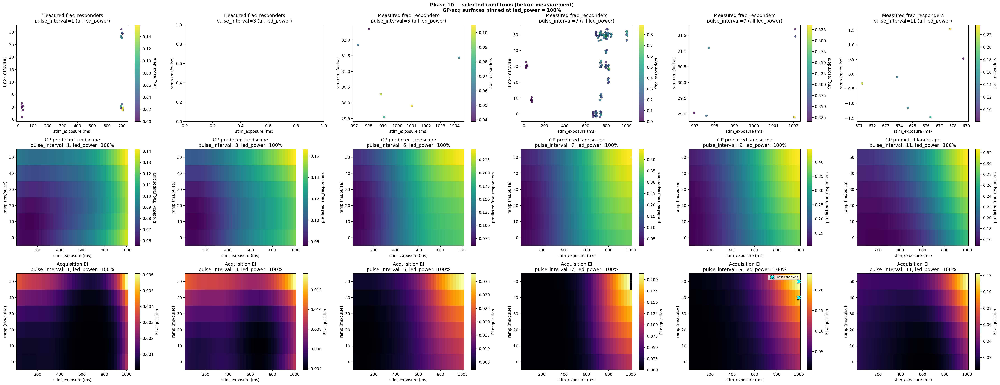

  Created 1620 events for phase 10
    Cond 0 (FOVs 180-185): stim_exposure=1000ms, ramp=50ms/pulse, pulse_interval=9 frames, led_power=100%, n_pulses=7 (final exposure clipped at 5000ms: 1300ms)
    Cond 1 (FOVs 186-191): stim_exposure=1000ms, ramp=30ms/pulse, pulse_interval=7 frames, led_power=20%, n_pulses=9 (final exposure clipped at 5000ms: 1240ms)
    Cond 2 (FOVs 192-197): stim_exposure=1000ms, ramp=40ms/pulse, pulse_interval=9 frames, led_power=100%, n_pulses=7 (final exposure clipped at 5000ms: 1240ms)
  Recovered optoRTK for FOV 197 after 1.0 s re-read (188 cells, mean=1100.515)
  Phase 10: 18 FOVs, mean frac_oscillating=0.9987, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


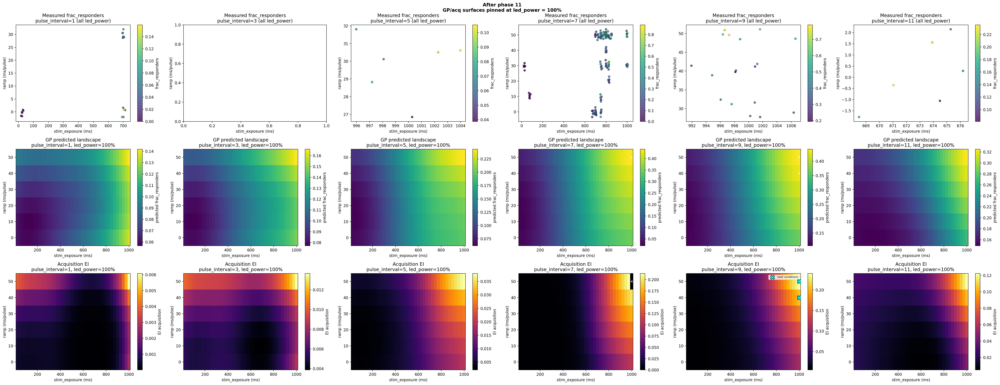


=== ComposedAgent: phase 12/13 ===
[FOVFinderAgent] Phase 11 — selected FOVs:
    G7_0000: 55 cells  cnr(mean=0.630, 81% below 0.9)
    G7_0001: 96 cells  cnr(mean=0.581, 89% below 0.9)
    G7_0002: 140 cells  cnr(mean=0.561, 90% below 0.9)
    G8_0000: 57 cells  cnr(mean=0.689, 85% below 0.9)
    G8_0001: 95 cells  cnr(mean=0.644, 86% below 0.9)
    G8_0002: 170 cells  cnr(mean=0.559, 92% below 0.9)
    G9_0000: 47 cells  cnr(mean=0.727, 76% below 0.9)
    G9_0001: 66 cells  cnr(mean=0.576, 92% below 0.9)
    G9_0002: 158 cells  cnr(mean=0.590, 88% below 0.9)
    G10_0000: 49 cells  cnr(mean=0.636, 94% below 0.9)
    G10_0001: 77 cells  cnr(mean=0.735, 77% below 0.9)
    G10_0002: 107 cells  cnr(mean=0.560, 89% below 0.9)
    G11_0000: 41 cells  cnr(mean=0.580, 88% below 0.9)
    G11_0001: 81 cells  cnr(mean=0.606, 88% below 0.9)
    G11_0002: 155 cells  cnr(mean=0.647, 86% below 0.9)
    G12_0000: 45 cells  cnr(mean=0.705, 78% below 0.9)
    G12_0001: 67 cells  cnr(mean=0.610, 86% b

sample: 100%|##########| 1200/1200 [00:31<00:00, 37.68it/s, 7 steps of size 5.86e-01. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      0.86      0.36      0.81      0.37      1.33    644.49      1.00
k_length[1]      2.86      1.76      2.42      0.87      4.85    550.75      1.00
k_length[2]      0.93      0.40      0.86      0.34      1.50    754.13      1.00
k_length[3]      6.72      4.58      5.48      1.29     13.01    745.92      1.00
k_length[4]      9.12      5.75      7.52      2.54     16.01    519.86      1.00
k_length[5]      3.46      0.94      3.36      1.88      4.83    694.85      1.00
k_length[6]      8.08      4.32      7.02      3.00     13.45    878.77      1.00
    k_scale      1.04      0.35      0.97      0.51      1.50    636.30      1.00
      noise      0.22      0.03      0.22      0.18      0.26    856.29      1.00

Computing robust acquisition over 229872 scenarios (14367 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 1.163164
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.060764
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14365 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 1.163164
  Robust acq stats: min=0.000000, max=0.058855
=== Phase 11: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(1000), 'ramp': np.int64(50), 'pulse_interval': np.int64(9), 'led_power': np.int64(80)}
  Condition 1: {'stim_exposure': np.int64(1000), 'ramp': np.int64(50), 'pulse_interval': np.int64(9), 'led_power': np.int64(20)}
  Condition 2: {'stim_exposure': np.int64(975), 'ramp': np.int64(50), 'pulse_interval': np.int64(9), 'led_power': np.int64(20)}


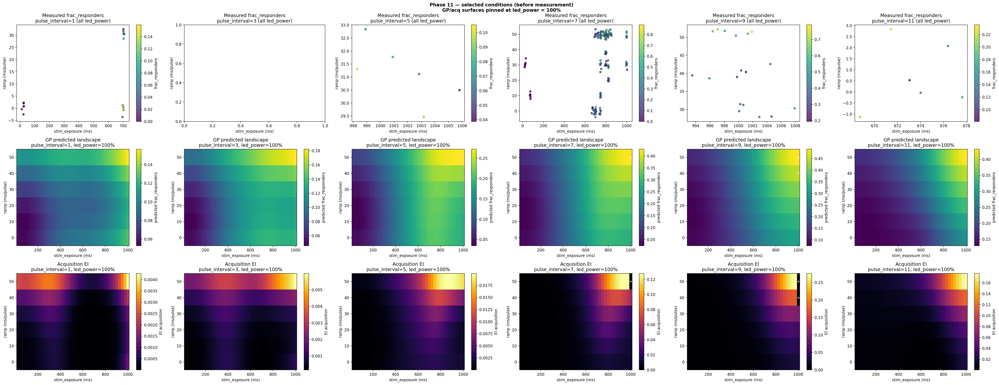

  Created 1620 events for phase 11
    Cond 0 (FOVs 198-203): stim_exposure=1000ms, ramp=50ms/pulse, pulse_interval=9 frames, led_power=80%, n_pulses=7 (final exposure clipped at 5000ms: 1300ms)
    Cond 1 (FOVs 204-209): stim_exposure=1000ms, ramp=50ms/pulse, pulse_interval=9 frames, led_power=20%, n_pulses=7 (final exposure clipped at 5000ms: 1300ms)
    Cond 2 (FOVs 210-215): stim_exposure=975ms, ramp=50ms/pulse, pulse_interval=9 frames, led_power=20%, n_pulses=7 (final exposure clipped at 5000ms: 1275ms)
  Recovered optoRTK for FOV 215 after 1.0 s re-read (70 cells, mean=1698.858)
  Phase 11: 18 FOVs, mean frac_oscillating=0.9996, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


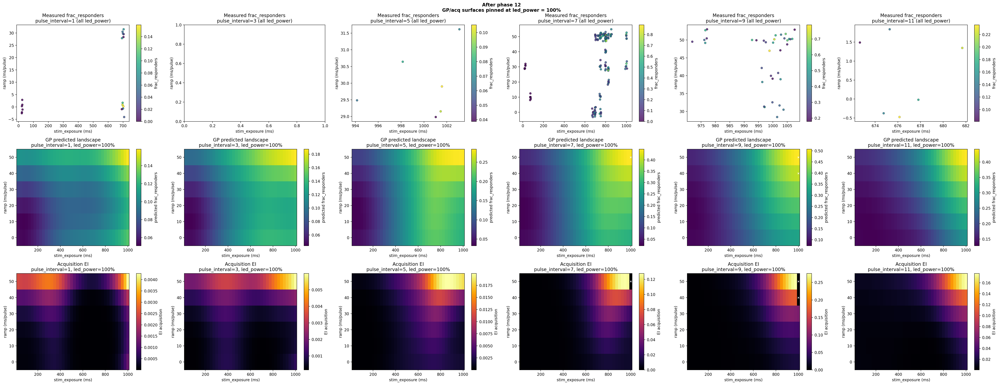


=== ComposedAgent: phase 13/13 ===
[FOVFinderAgent] Phase 12 — selected FOVs:
    H12_0000: 38 cells  cnr(mean=0.625, 84% below 0.9)
    H12_0001: 56 cells  cnr(mean=0.538, 91% below 0.9)
    H12_0002: 102 cells  cnr(mean=0.608, 86% below 0.9)
    H11_0000: 70 cells  cnr(mean=0.581, 89% below 0.9)
    H11_0001: 85 cells  cnr(mean=0.617, 86% below 0.9)
    H11_0002: 187 cells  cnr(mean=0.559, 93% below 0.9)
    H10_0000: 39 cells  cnr(mean=0.659, 76% below 0.9)
    H10_0001: 64 cells  cnr(mean=0.670, 83% below 0.9)
    H10_0002: 130 cells  cnr(mean=0.566, 94% below 0.9)
    H9_0000: 50 cells  cnr(mean=0.533, 90% below 0.9)
    H9_0001: 69 cells  cnr(mean=0.590, 91% below 0.9)
    H9_0002: 137 cells  cnr(mean=0.533, 96% below 0.9)
    H8_0000: 35 cells  cnr(mean=0.560, 86% below 0.9)
    H8_0001: 56 cells  cnr(mean=0.592, 88% below 0.9)
    H8_0002: 150 cells  cnr(mean=0.568, 95% below 0.9)
    H7_0000: 65 cells  cnr(mean=0.494, 92% below 0.9)
    H7_0001: 95 cells  cnr(mean=0.505, 96% 

sample: 100%|##########| 1200/1200 [00:30<00:00, 39.71it/s, 7 steps of size 5.70e-01. acc. prob=0.88]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
k_length[0]      0.74      0.28      0.72      0.31      1.13    810.13      1.00
k_length[1]      3.63      2.22      3.11      0.89      6.58    657.77      1.00
k_length[2]      0.87      0.37      0.82      0.35      1.51    884.51      1.00
k_length[3]      4.17      2.77      3.47      0.88      8.01    976.12      1.00
k_length[4]      9.81      6.27      8.03      3.46     17.98    374.11      1.00
k_length[5]      3.46      0.91      3.36      2.11      5.02    735.12      1.00
k_length[6]      8.09      4.71      7.09      2.93     13.71    798.55      1.00
    k_scale      1.05      0.35      0.96      0.52      1.49    570.73      1.00
      noise      0.24      0.03      0.24      0.19      0.28    858.96      1.00

Computing robust acquisition over 229824 scenarios (14364 grid points x 16 covariate samples)...
  best_f (scaled, from GP predicted mean over grid): 0.729820
  Robust acq stats:

c:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\.venv\Lib\site-packages\jax\_src\ops\scatter.py:104: FutureWarning: scatter inputs have incompatible types: cannot safely cast value from dtype=float32 to dtype=int32 with jax_numpy_dtype_promotion=standard. In future JAX releases this will result in an error.
  warnings.warn(


  Robust acq stats: min=0.000000, max=0.042671
  [reusing cached GP fit from earlier in this batch]
  [cached predict] reusing predictions for 14362 grid points x 16 covariate samples
  best_f (scaled, from GP predicted mean over grid): 0.729820
  Robust acq stats: min=0.000000, max=0.042660
=== Phase 12: BO-selected batch ===
  Condition 0: {'stim_exposure': np.int64(975), 'ramp': np.int64(50), 'pulse_interval': np.int64(9), 'led_power': np.int64(100)}
  Condition 1: {'stim_exposure': np.int64(1000), 'ramp': np.int64(30), 'pulse_interval': np.int64(9), 'led_power': np.int64(100)}
  Condition 2: {'stim_exposure': np.int64(1000), 'ramp': np.int64(40), 'pulse_interval': np.int64(9), 'led_power': np.int64(90)}


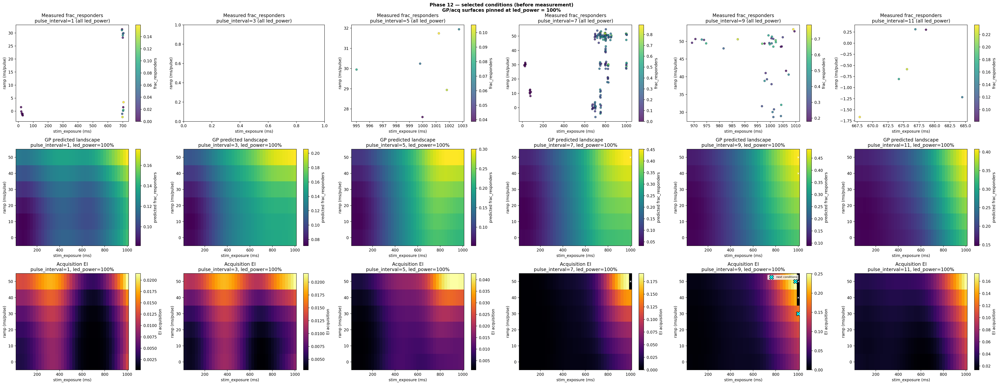

  Created 1620 events for phase 12
    Cond 0 (FOVs 216-221): stim_exposure=975ms, ramp=50ms/pulse, pulse_interval=9 frames, led_power=100%, n_pulses=7 (final exposure clipped at 5000ms: 1275ms)
    Cond 1 (FOVs 222-227): stim_exposure=1000ms, ramp=30ms/pulse, pulse_interval=9 frames, led_power=100%, n_pulses=7 (final exposure clipped at 5000ms: 1180ms)
    Cond 2 (FOVs 228-233): stim_exposure=1000ms, ramp=40ms/pulse, pulse_interval=9 frames, led_power=90%, n_pulses=7 (final exposure clipped at 5000ms: 1240ms)
  Recovered optoRTK for FOV 233 after 1.0 s re-read (184 cells, mean=1536.374)
  Phase 12: 18 FOVs, mean frac_oscillating=0.9993, max=1.0000
  optoRTK re-read retry: recovered 1/1 FOVs (0 still skipped)


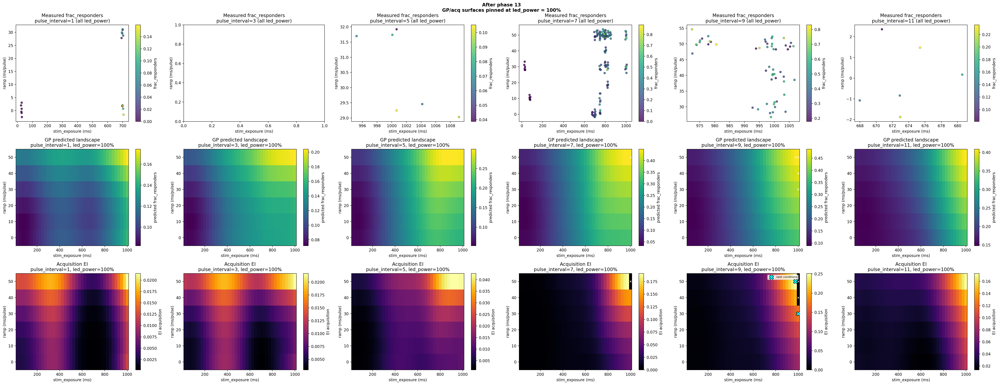

In [15]:
# --- Run the composed (FOV finder + BO) loop ---
# Each phase: FOVFinder picks 18 fresh FOVs (3 FOVs in 6 fresh wells), then
# OscillationBO runs one batch BO iteration over those FOVs.  The GP
# accumulates observations across all phases.


# Disconnect napari live view so it does not interfere with the acquisition engine
try:
    mm_wdg._core_link.cleanup()
except:
    pass


composed_agent.run()

In [16]:
# Post-processing: merge per-FOV tracks
utils.generate_exp_data_from_tracks(path)

## Visualise results

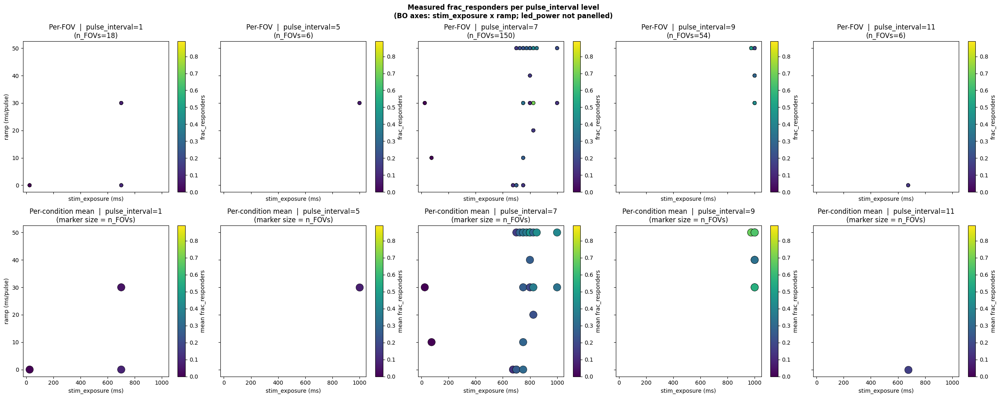

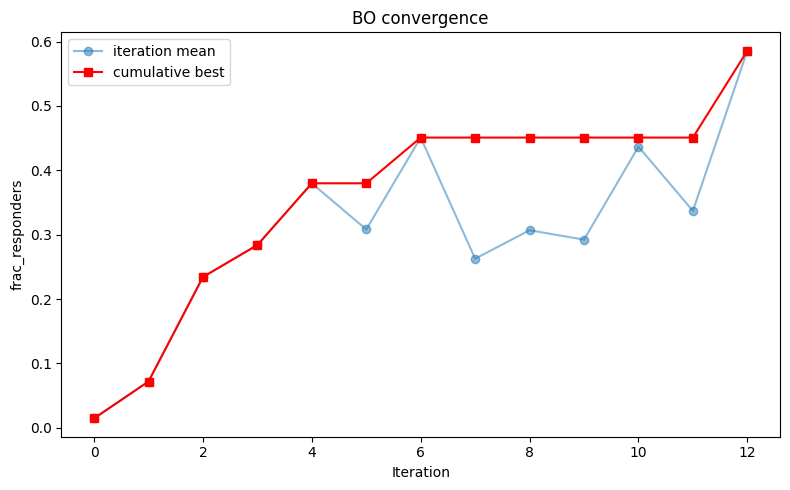

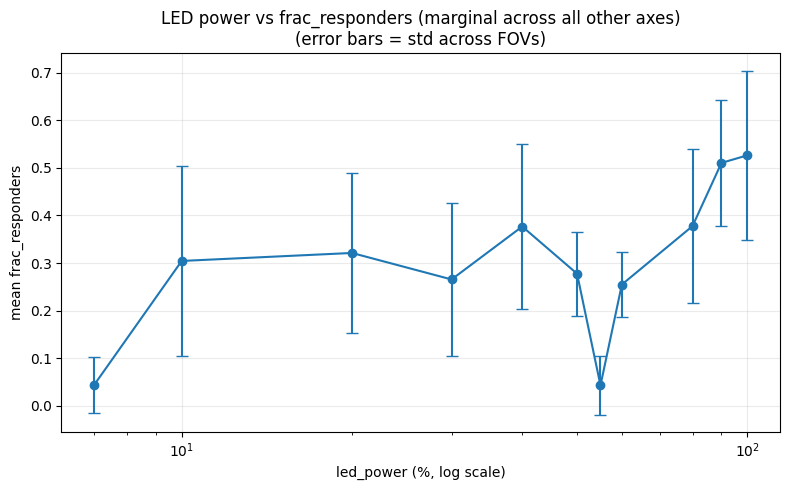


Best condition by frac_responders (mean across FOVs):
  stim_exposure  = 975 ms
  ramp           = 50 ms/pulse
  pulse_interval = 9 frames
  led_power      = 100 %
  mean frac_responders= 0.6870
  tested on 6 FOVs


In [17]:
if agent.df_results is not None and not agent.df_results.empty:
    df = agent.df_results
    obj_name = agent.objective_metric.name

    # Per-pulse_interval panel grid:
    #   row 0 -- per-FOV scatter (stim_exposure x ramp colored by objective)
    #   row 1 -- per-condition mean across FOVs (size = n_fovs in that condition)
    pi_levels = sorted(df["pulse_interval"].astype(int).unique().tolist())
    n_levels = len(pi_levels)

    vmin = float(df[obj_name].min())
    vmax = float(df[obj_name].max())

    fig, axes = plt.subplots(
        2, n_levels, figsize=(5 * n_levels, 10), squeeze=False, sharex=True, sharey=True
    )

    for col, pi in enumerate(pi_levels):
        df_pi = df[df["pulse_interval"].astype(int) == pi]

        ax = axes[0, col]
        if not df_pi.empty:
            sc = ax.scatter(
                df_pi["stim_exposure"],
                df_pi["ramp"],
                c=df_pi[obj_name],
                cmap="viridis",
                s=40,
                edgecolors="k",
                linewidths=0.5,
                vmin=vmin,
                vmax=vmax,
            )
            fig.colorbar(sc, ax=ax, label=obj_name)
        ax.set_xlabel("stim_exposure (ms)")
        if col == 0:
            ax.set_ylabel("ramp (ms/pulse)")
        ax.set_title(f"Per-FOV  |  pulse_interval={pi}\n(n_FOVs={len(df_pi)})")

        ax = axes[1, col]
        cond_agg = (
            df_pi.groupby(["stim_exposure", "ramp", "led_power"])
            .agg(mean_obj=(obj_name, "mean"), n_fovs=(obj_name, "count"))
            .reset_index()
        )
        if not cond_agg.empty:
            sc = ax.scatter(
                cond_agg["stim_exposure"],
                cond_agg["ramp"],
                c=cond_agg["mean_obj"],
                s=cond_agg["n_fovs"] * 30,
                cmap="viridis",
                edgecolors="k",
                linewidths=0.5,
                vmin=vmin,
                vmax=vmax,
            )
            fig.colorbar(sc, ax=ax, label=f"mean {obj_name}")
        ax.set_xlabel("stim_exposure (ms)")
        if col == 0:
            ax.set_ylabel("ramp (ms/pulse)")
        ax.set_title(
            f"Per-condition mean  |  pulse_interval={pi}\n(marker size = n_FOVs)"
        )

    fig.suptitle(
        f"Measured {obj_name} per pulse_interval level\n"
        "(BO axes: stim_exposure x ramp; led_power not panelled)",
        fontsize=12,
        fontweight="bold",
    )
    plt.tight_layout()
    plt.show()

    # --- Convergence ---
    if agent._iteration_means:
        fig, ax = plt.subplots(figsize=(8, 5))
        means = np.array(agent._iteration_means)
        cumulative_best = np.maximum.accumulate(means)
        ax.plot(means, "o-", alpha=0.5, label="iteration mean")
        ax.plot(cumulative_best, "s-", color="red", label="cumulative best")
        ax.set_xlabel("Iteration")
        ax.set_ylabel(obj_name)
        ax.set_title("BO convergence")
        ax.legend()
        plt.tight_layout()
        plt.show()

    # --- led_power 1D summary ---
    # Marginal effect of LED power on the objective: groupby led_power,
    # mean across all (stim_exposure, ramp, pulse_interval) trials.  Shows
    # the LED-saturation curve the BO is exploiting.
    fig, ax = plt.subplots(figsize=(8, 5))
    pwr_agg = (
        df.groupby("led_power")
        .agg(
            mean_obj=(obj_name, "mean"),
            std_obj=(obj_name, "std"),
            n_fovs=(obj_name, "count"),
        )
        .reset_index()
    )
    ax.errorbar(
        pwr_agg["led_power"],
        pwr_agg["mean_obj"],
        yerr=pwr_agg["std_obj"].fillna(0.0),
        fmt="o-",
        capsize=4,
    )
    ax.set_xscale("log")  # log axis matches log_scale=True on the BO param
    ax.set_xlabel("led_power (%, log scale)")
    ax.set_ylabel(f"mean {obj_name}")
    ax.set_title(
        f"LED power vs {obj_name} (marginal across all other axes)\n"
        "(error bars = std across FOVs)"
    )
    ax.grid(alpha=0.25)
    plt.tight_layout()
    plt.show()

    # --- Best condition (full 4-axis grid) ---
    cond_agg_all = (
        df.groupby(["stim_exposure", "ramp", "pulse_interval", "led_power"])
        .agg(mean_obj=(obj_name, "mean"), n_fovs=(obj_name, "count"))
        .reset_index()
    )
    best_idx = cond_agg_all["mean_obj"].idxmax()
    best = cond_agg_all.loc[best_idx]
    print(f"\nBest condition by {obj_name} (mean across FOVs):")
    print(f"  stim_exposure  = {best['stim_exposure']:.0f} ms")
    print(f"  ramp           = {best['ramp']:.0f} ms/pulse")
    print(f"  pulse_interval = {int(best['pulse_interval'])} frames")
    print(f"  led_power      = {int(best['led_power'])} %")
    print(f"  mean {obj_name:<13}= {best['mean_obj']:.4f}")
    print(f"  tested on {int(best['n_fovs'])} FOVs")
else:
    print("No data collected yet.")

In [ ]:
# GP-predicted landscape for v10, marginalised over covariates AND
# led_power (since rendering 5 pulse_interval x 10 led_power = 50 panels
# is overwhelming).  We average GP predictions over both joint covariate
# samples and the empirical led_power distribution observed so far.
import gpax
import gpax.utils
from faro.agents.bo_optimization_sparse import _safe_batch_size

if agent.model is not None and agent.x is not None:
    obj_name = agent.objective_metric.name
    rng_key, rng_key_pred = gpax.utils.get_keys()

    exposure_vals = np.arange(25.0, 1000.0 + 25.0, 25.0)  # 40 levels
    ramp_vals = np.arange(0.0, 50.0 + 10.0, 10.0)  # 6 levels
    pi_levels = sorted(np.unique(agent.x_total_linespace[:, 2]).astype(int).tolist())
    pwr_levels = sorted(np.unique(agent.x_total_linespace[:, 3]).astype(int).tolist())
    n_pi = len(pi_levels)
    n_e = len(exposure_vals)
    n_r = len(ramp_vals)
    n_p = len(pwr_levels)

    df = agent.df_results
    n_cov_samples = 50
    cov_vals_full = df[[c.name for c in agent.bo_covariates]].to_numpy(dtype=float)
    if cov_vals_full.shape[0] == 0:
        raise RuntimeError("No covariate observations available for marginalisation.")
    _rng = np.random.default_rng(0)
    idx = _rng.integers(0, cov_vals_full.shape[0], size=n_cov_samples)
    cov_samples = cov_vals_full[idx]

    # Combined ctrl_grid spanning all (pulse_interval, led_power) combos.
    # Layout: outer pi, then power, then exposure, then ramp.
    ctrl_grid = np.array(
        [
            [e, r, float(pi), float(pwr)]
            for pi in pi_levels
            for pwr in pwr_levels
            for e in exposure_vals
            for r in ramp_vals
        ]
    )
    n_grid = ctrl_grid.shape[0]

    x_full = np.hstack(
        [
            np.repeat(ctrl_grid, n_cov_samples, axis=0),
            np.tile(cov_samples, (n_grid, 1)),
        ]
    )
    x_full_scaled = agent._x_scaler.transform(x_full)

    n_rows = np.asarray(x_full_scaled).shape[0]
    bs = _safe_batch_size(n_rows, 2000)
    y_pred_scaled, _ = agent.model.predict_in_batches(
        rng_key_pred,
        x_full_scaled,
        batch_size=bs,
        n=1,
        noiseless=True,
    )
    y_pred = agent._y_scaler.inverse_transform(
        np.asarray(y_pred_scaled).reshape(-1, 1)
    ).flatten()

    Y_marg = y_pred.reshape(n_grid, n_cov_samples).mean(axis=1)
    # axes after reshape: (pi, pwr, exposure, ramp)
    Y_4d = Y_marg.reshape(n_pi, n_p, n_e, n_r)

    # Marginalise over led_power (mean) for the per-pulse_interval surfaces.
    Y_3d = Y_4d.mean(axis=1)  # (pi, exposure, ramp)
    pi_optima = {}
    for i, pi in enumerate(pi_levels):
        flat_idx = int(np.argmax(Y_3d[i]))
        e_idx, r_idx = np.unravel_index(flat_idx, (n_e, n_r))
        pi_optima[pi] = (
            float(exposure_vals[e_idx]),
            float(ramp_vals[r_idx]),
            float(Y_3d[i, e_idx, r_idx]),
        )

    vmin = float(Y_3d.min())
    vmax = float(Y_3d.max())
    global_best_pi = max(pi_levels, key=lambda p: pi_optima[p][2])

    fig, axes = plt.subplots(
        1, len(pi_levels), figsize=(7 * len(pi_levels), 6), squeeze=False, sharey=True
    )
    for col, pi in enumerate(pi_levels):
        ax = axes[0, col]
        Y_grid = Y_3d[col]
        cf = ax.contourf(
            ramp_vals,
            exposure_vals,
            Y_grid,
            levels=20,
            cmap="viridis",
            vmin=vmin,
            vmax=vmax,
        )
        fig.colorbar(cf, ax=ax, label=f"predicted {obj_name}")

        df_pi = df[df["pulse_interval"].astype(int) == pi]
        if not df_pi.empty:
            ax.scatter(
                df_pi["ramp"],
                df_pi["stim_exposure"],
                c=df_pi[obj_name],
                cmap="viridis",
                s=30,
                edgecolors="white",
                linewidths=0.5,
                vmin=vmin,
                vmax=vmax,
                zorder=5,
            )

        opt_e, opt_r, opt_val = pi_optima[pi]
        is_global = pi == global_best_pi
        ax.scatter(
            opt_r,
            opt_e,
            c="red",
            s=240 if is_global else 180,
            marker="*",
            edgecolors="black",
            linewidths=2,
            zorder=10,
            label=(
                f"opt: exp={opt_e:.0f}ms, ramp={opt_r:.0f}\n"
                f"pred={opt_val:.3f}{'  (global)' if is_global else ''}"
            ),
        )
        ax.set_xlabel("ramp (ms/pulse)")
        if col == 0:
            ax.set_ylabel("stim_exposure (ms)")
        ax.set_title(f"pulse_interval = {pi}")
        ax.legend(loc="lower right", fontsize=7)

    fig.suptitle(
        f"GP-predicted {obj_name} per pulse_interval\n"
        f"(marginalised over led_power AND {n_cov_samples} joint covariate samples)",
        fontsize=12,
        fontweight="bold",
    )
    plt.tight_layout()
    plt.show()

    # --- Marginal effect of led_power on the GP surface ---
    # Average over (pulse_interval, exposure, ramp) for each led_power,
    # to visualise the LED saturation curve the BO is fitting.
    Y_pwr = Y_4d.mean(axis=(0, 2, 3))  # axis-aligned mean -> (n_p,)
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.plot(pwr_levels, Y_pwr, "o-", lw=1.5)
    ax.set_xscale("log")
    ax.set_xlabel("led_power (%, log scale)")
    ax.set_ylabel(f"GP-predicted mean {obj_name}")
    ax.set_title("LED power saturation curve (GP marginal)")
    ax.grid(alpha=0.25)
    plt.tight_layout()
    plt.show()

    print(
        f"GP-predicted optimum per pulse_interval (led_power and covariates marginalised):"
    )
    for pi in pi_levels:
        opt_e, opt_r, opt_val = pi_optima[pi]
        marker = "  <- global" if pi == global_best_pi else ""
        print(
            f"  pulse_interval={pi}: stim_exposure={opt_e:>5.0f}ms  "
            f"ramp={opt_r:>4.0f}ms  predicted={obj_name}={opt_val:.4f}{marker}"
        )
    bp = pi_optima[global_best_pi]
    print(
        f"\nGlobal optimum: pulse_interval={global_best_pi}, "
        f"stim_exposure={bp[0]:.0f}ms, ramp={bp[1]:.0f}ms, "
        f"predicted {obj_name}={bp[2]:.4f}"
    )

Predicting on 211200 rows (n_grid=13200, n_cov_samples=16)...
  done in 165.3s


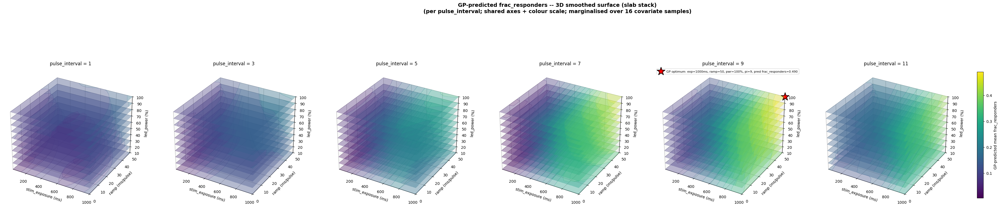

In [23]:
# GP-predicted 3D surface of the BO objective, marginalised over the
# observed covariate distribution.  For each pulse_interval (panel) we
# render a stack of horizontal slabs -- one slab per led_power level --
# where each slab is a contourf of GP-predicted frac_responders over
# (stim_exposure, ramp).  Slabs use low alpha so you can see through the
# volume; the global GP-predicted optimum is marked by a red star in
# the panel that owns it.
#
# Speed: uses ``agent._predict_mean_diag_var_closed_form`` (the same
# closed-form path the BO acquisition uses with
# ``use_closed_form_predict=True``).  This is ~10x faster than
# ``predict_in_batches`` because it skips the O(N^3) Cholesky-on-the-
# full-predictive-covariance + MC-sample step.
#
# Cache: results are stored in ``_gp_4d_cache`` keyed by the grid spec.
# Re-running the cell with the same spec reuses the cached arrays so
# plotting tweaks (figsize, alpha, etc.) don't trigger a re-prediction.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401  -- registers 3d projection

if agent.model is None or agent.x is None:
    print("No GP model fitted yet.")
else:
    obj_name = agent.objective_metric.name

    # Smooth grid -- comparable in size to the BO grid (40x6) but more
    # uniform in (exposure, ramp).  Bump if you need finer surfaces;
    # cost scales linearly with n_e * n_r * n_cov_samples.
    exposure_vals = np.linspace(25.0, 1000.0, 20)
    ramp_vals = np.linspace(0.0, 50.0, 11)
    pi_levels = sorted(np.unique(agent.x_total_linespace[:, 2]).astype(int).tolist())
    pwr_levels = sorted(np.unique(agent.x_total_linespace[:, 3]).astype(int).tolist())
    n_pi, n_p = len(pi_levels), len(pwr_levels)
    n_e, n_r = len(exposure_vals), len(ramp_vals)
    n_cov_samples = 16  # matches agent.n_cov_samples used during BO

    grid_key = (
        n_pi,
        n_p,
        n_e,
        n_r,
        n_cov_samples,
        float(exposure_vals[0]),
        float(exposure_vals[-1]),
        float(ramp_vals[0]),
        float(ramp_vals[-1]),
        tuple(pi_levels),
        tuple(pwr_levels),
        id(agent.model),  # invalidate cache if a new model is fit
    )

    cache_hit = (
        "_gp_4d_cache" in globals() and _gp_4d_cache.get("_grid_key") == grid_key
    )

    if cache_hit:
        print("Reusing cached GP predictions.")
        Y_4d = _gp_4d_cache["Y_4d"]
        S_4d = _gp_4d_cache["S_4d"]
    else:
        df = agent.df_results
        cov_vals_full = df[[c.name for c in agent.bo_covariates]].to_numpy(dtype=float)
        if cov_vals_full.shape[0] == 0:
            raise RuntimeError("No covariate observations available.")
        _rng = np.random.default_rng(0)
        cov_samples = cov_vals_full[
            _rng.integers(0, cov_vals_full.shape[0], size=n_cov_samples)
        ]

        ctrl_grid = np.array(
            [
                [e, r, float(pi), float(pwr)]
                for pi in pi_levels
                for pwr in pwr_levels
                for e in exposure_vals
                for r in ramp_vals
            ]
        )
        n_grid = ctrl_grid.shape[0]

        x_full = np.hstack(
            [
                np.repeat(ctrl_grid, n_cov_samples, axis=0),
                np.tile(cov_samples, (n_grid, 1)),
            ]
        )
        x_full_scaled = agent._x_scaler.transform(x_full)

        # Closed-form predict: returns posterior mean + diag(var) in
        # scaled-y space, no MC sampling.  ~10x cheaper than
        # predict_in_batches; same path the BO acquisition uses.
        print(
            f"Predicting on {x_full_scaled.shape[0]} rows "
            f"(n_grid={n_grid}, n_cov_samples={n_cov_samples})..."
        )
        t0 = time.time()
        mean_flat_scaled, _ = agent._predict_mean_diag_var_closed_form(
            agent.model,
            x_full_scaled,
            batch_size=2000,
            noiseless=True,
        )
        y_pred = agent._y_scaler.inverse_transform(
            np.asarray(mean_flat_scaled).reshape(-1, 1)
        ).flatten()
        print(f"  done in {time.time() - t0:.1f}s")

        y_per_cov = y_pred.reshape(n_grid, n_cov_samples)
        Y_marg = y_per_cov.mean(axis=1)  # marginal posterior mean
        Y_cov_std = y_per_cov.std(axis=1)  # covariate-induced std at each grid pt

        Y_4d = Y_marg.reshape(n_pi, n_p, n_e, n_r)
        S_4d = Y_cov_std.reshape(n_pi, n_p, n_e, n_r)

    # SHARED bounds across all pulse_interval panels --------------------
    xlim = (float(exposure_vals[0]), float(exposure_vals[-1]))
    ylim = (float(ramp_vals[0]), float(ramp_vals[-1]))
    zlim = (float(pwr_levels[0]), float(pwr_levels[-1]))
    vmin = float(Y_4d.min())
    vmax = float(Y_4d.max())
    cbar_levels = np.linspace(vmin, vmax, 16)

    flat = int(np.argmax(Y_4d))
    pi_i, p_i, e_i, r_i = np.unravel_index(flat, Y_4d.shape)
    opt_pi = pi_levels[pi_i]
    opt_pwr = pwr_levels[p_i]
    opt_e = float(exposure_vals[e_i])
    opt_r = float(ramp_vals[r_i])
    opt_val = float(Y_4d[pi_i, p_i, e_i, r_i])

    fig = plt.figure(figsize=(9 * n_pi, 10))
    E_grid, R_grid = np.meshgrid(exposure_vals, ramp_vals, indexing="ij")

    panel_axes = []
    for col, pi in enumerate(pi_levels):
        ax = fig.add_subplot(1, n_pi, col + 1, projection="3d")
        panel_axes.append(ax)

        for k, pwr in enumerate(pwr_levels):
            vals = Y_4d[col, k]
            ax.contourf(
                E_grid,
                R_grid,
                vals,
                zdir="z",
                offset=float(pwr),
                levels=cbar_levels,
                cmap="viridis",
                vmin=vmin,
                vmax=vmax,
                alpha=0.35,
            )

        if pi == opt_pi:
            ax.scatter(
                [opt_e],
                [opt_r],
                [opt_pwr],
                c="red",
                marker="*",
                s=480,
                edgecolors="black",
                linewidths=1.5,
                depthshade=False,
                label=(
                    f"GP optimum: exp={opt_e:.0f}ms, ramp={opt_r:.0f}, "
                    f"pwr={opt_pwr}%, pi={opt_pi}, "
                    f"pred {obj_name}={opt_val:.3f}"
                ),
            )
            ax.legend(loc="upper left", fontsize=8)

        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        ax.set_zlim(*zlim)
        ax.set_xlabel("stim_exposure (ms)")
        ax.set_ylabel("ramp (ms/pulse)")
        ax.set_zlabel("led_power (%)")
        ax.set_title(f"pulse_interval = {pi}", fontsize=12)

    mappable = plt.cm.ScalarMappable(
        cmap="viridis", norm=plt.Normalize(vmin=vmin, vmax=vmax)
    )
    mappable.set_array([])
    fig.colorbar(
        mappable,
        ax=panel_axes,
        shrink=0.6,
        pad=0.02,
        label=f"GP-predicted mean {obj_name}",
    )
    fig.suptitle(
        f"GP-predicted {obj_name} -- 3D smoothed surface (slab stack)\n"
        f"(per pulse_interval; shared axes + colour scale; "
        f"marginalised over {n_cov_samples} covariate samples)",
        fontsize=14,
        fontweight="bold",
    )
    plt.show()

    _gp_4d_cache = dict(
        _grid_key=grid_key,
        Y_4d=Y_4d,
        S_4d=S_4d,
        exposure_vals=exposure_vals,
        ramp_vals=ramp_vals,
        pi_levels=pi_levels,
        pwr_levels=pwr_levels,
        opt=(opt_pi, opt_pwr, opt_e, opt_r, opt_val),
        vmin=vmin,
        vmax=vmax,
    )

=== Spatial summary (across the smoothed control grid) ===
  Control-axis range of predicted frac_responders:  0.4861
  Covariate-driven std (mean across grid):    0.0452
  Covariate-driven std (max across grid):     0.1629
  Covariate-driven std at GP optimum:         0.1143
  Ratio  cov_std_mean / ctrl_range         =  0.093



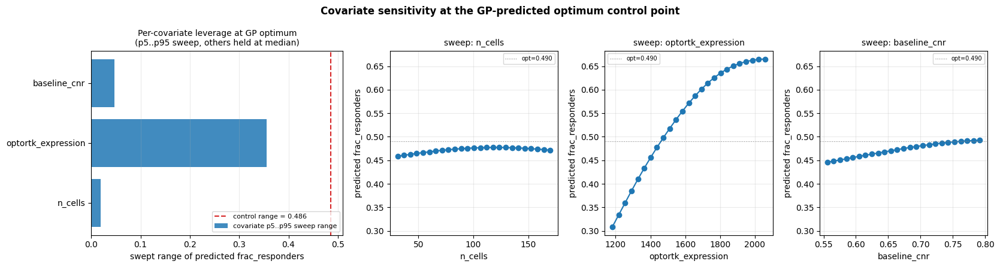

=== Per-covariate leverage at GP optimum ===
  n_cells                sweep range = 0.0188  (=   3.9% of control range)
  optortk_expression     sweep range = 0.3562  (=  73.3% of control range)
  baseline_cnr           sweep range = 0.0467  (=   9.6% of control range)


In [24]:
# Covariate sensitivity: how much do the observed covariates shift the
# GP-predicted oscillation probability?  Two views:
#   (1) Spatial summary -- aggregate statistics that compare control-axis
#       leverage (max-min of the marginalised GP surface) to covariate-
#       driven std (mean across the same grid).
#   (2) Per-covariate one-axis sweep at the GP optimum -- for each
#       covariate we sweep its observed 5..95 percentile range while
#       fixing the others at the empirical median, and read off the
#       resulting range of GP-predicted frac_responders.  That range is
#       the covariate's leverage at the best operating point.
#
# Reuses _gp_4d_cache produced by the previous cell so we don't rebuild
# the marginalised grid from scratch.
if "_gp_4d_cache" not in globals() or agent.model is None:
    print("Run the GP-surface cell first to populate _gp_4d_cache.")
else:
    obj_name = agent.objective_metric.name
    cache = _gp_4d_cache
    Y_4d = cache["Y_4d"]
    S_4d = cache["S_4d"]
    opt_pi, opt_pwr, opt_e, opt_r, opt_val = cache["opt"]

    # --- (1) Spatial summary --------------------------------------------
    ctrl_range = float(Y_4d.max() - Y_4d.min())
    cov_std_mean = float(S_4d.mean())
    cov_std_max = float(S_4d.max())
    pi_idx = cache["pi_levels"].index(opt_pi)
    p_idx = cache["pwr_levels"].index(opt_pwr)
    e_idx = int(np.argmin(np.abs(cache["exposure_vals"] - opt_e)))
    r_idx = int(np.argmin(np.abs(cache["ramp_vals"] - opt_r)))
    cov_std_at_opt = float(S_4d[pi_idx, p_idx, e_idx, r_idx])

    print("=== Spatial summary (across the smoothed control grid) ===")
    print(f"  Control-axis range of predicted {obj_name}:  {ctrl_range:.4f}")
    print(f"  Covariate-driven std (mean across grid):    {cov_std_mean:.4f}")
    print(f"  Covariate-driven std (max across grid):     {cov_std_max:.4f}")
    print(f"  Covariate-driven std at GP optimum:         {cov_std_at_opt:.4f}")
    print(
        f"  Ratio  cov_std_mean / ctrl_range         =  "
        f"{cov_std_mean / max(ctrl_range, 1e-9):.3f}"
    )
    print()

    # --- (2) Per-covariate sweep at the GP optimum control point --------
    df = agent.df_results
    cov_names = [c.name for c in agent.bo_covariates]
    cov_vals_full = df[cov_names].to_numpy(dtype=float)
    medians = np.median(cov_vals_full, axis=0)
    p5 = np.percentile(cov_vals_full, 5, axis=0)
    p95 = np.percentile(cov_vals_full, 95, axis=0)

    sweep_n = 25
    leverages = []
    sweep_curves = {}

    rng_key, rng_key_pred2 = gpax.utils.get_keys()
    for j, name in enumerate(cov_names):
        sweep = np.linspace(p5[j], p95[j], sweep_n)
        cov_block = np.tile(medians, (sweep_n, 1))
        cov_block[:, j] = sweep

        ctrl_at_opt = np.tile(
            np.array([opt_e, opt_r, float(opt_pi), float(opt_pwr)]),
            (sweep_n, 1),
        )
        x_sweep = np.hstack([ctrl_at_opt, cov_block])
        x_sweep_scaled = agent._x_scaler.transform(x_sweep)

        y_scaled, _ = agent.model.predict_in_batches(
            rng_key_pred2,
            x_sweep_scaled,
            batch_size=sweep_n,
            n=1,
            noiseless=True,
        )
        y_pred = agent._y_scaler.inverse_transform(
            np.asarray(y_scaled).reshape(-1, 1)
        ).flatten()
        leverages.append(float(y_pred.max() - y_pred.min()))
        sweep_curves[name] = (sweep, y_pred)

    # --- Plot: leverage bar chart + per-covariate sweep curves ---------
    n_cov = len(cov_names)
    fig, axes = plt.subplots(
        1,
        1 + n_cov,
        figsize=(4.2 * (1 + n_cov), 4.5),
        gridspec_kw={"width_ratios": [1.5] + [1.0] * n_cov},
    )
    ax_bar, *ax_sweeps = axes

    # Bar chart on the LEFT, with a dashed red reference line for the
    # control-axis range so the reader can see at a glance how covariate
    # leverage compares with what the controls can do.
    bar_colors = ["C0"] * n_cov
    ax_bar.barh(
        cov_names,
        leverages,
        color=bar_colors,
        alpha=0.85,
        label="covariate p5..p95 sweep range",
    )
    ax_bar.axvline(
        ctrl_range,
        color="C3",
        lw=1.5,
        ls="--",
        label=f"control range = {ctrl_range:.3f}",
    )
    ax_bar.set_xlabel(f"swept range of predicted {obj_name}")
    ax_bar.set_title(
        "Per-covariate leverage at GP optimum\n"
        "(p5..p95 sweep, others held at median)",
        fontsize=10,
    )
    ax_bar.grid(axis="x", alpha=0.25)
    ax_bar.legend(fontsize=8, loc="lower right")

    # One sweep curve per covariate, each in its own panel so disparate
    # x-scales (n_cells vs optortk_expression vs baseline_cnr) don't
    # collide on a shared axis.
    y_global_min = min(curve[1].min() for curve in sweep_curves.values())
    y_global_max = max(curve[1].max() for curve in sweep_curves.values())
    pad = 0.05 * max(y_global_max - y_global_min, 1e-3)
    for ax, (name, (sweep, y_pred)) in zip(ax_sweeps, sweep_curves.items()):
        ax.plot(sweep, y_pred, "o-", lw=1.5, color="C0")
        ax.axhline(opt_val, color="grey", lw=0.8, ls=":", label=f"opt={opt_val:.3f}")
        ax.set_xlabel(name)
        ax.set_ylabel(f"predicted {obj_name}")
        ax.set_title(f"sweep: {name}", fontsize=10)
        ax.set_ylim(y_global_min - pad, y_global_max + pad)
        ax.grid(alpha=0.25)
        ax.legend(fontsize=7)

    fig.suptitle(
        "Covariate sensitivity at the GP-predicted optimum control point",
        fontsize=12,
        fontweight="bold",
    )
    plt.tight_layout()
    plt.show()

    print("=== Per-covariate leverage at GP optimum ===")
    for name, lev in zip(cov_names, leverages):
        share = lev / max(ctrl_range, 1e-9)
        print(
            f"  {name:<22s} sweep range = {lev:.4f}  "
            f"(= {share*100:5.1f}% of control range)"
        )

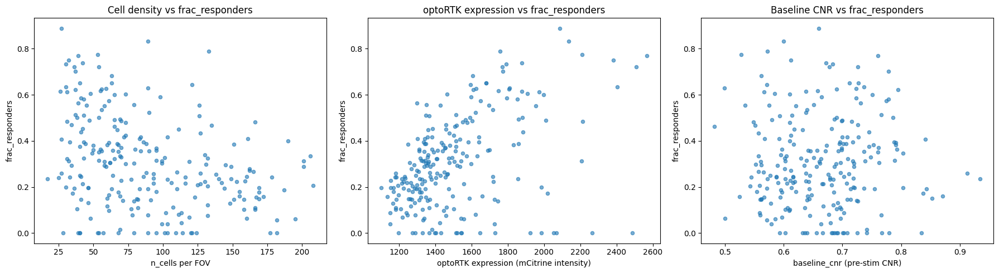

In [25]:
# Covariate effects on the configured BO objective (per FOV)
if agent.df_results is not None and not agent.df_results.empty:
    df = agent.df_results
    obj_name = agent.objective_metric.name

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    axes[0].scatter(df["n_cells"], df[obj_name], alpha=0.6, s=20)
    axes[0].set_xlabel("n_cells per FOV")
    axes[0].set_ylabel(obj_name)
    axes[0].set_title(f"Cell density vs {obj_name}")

    axes[1].scatter(df["optortk_expression"], df[obj_name], alpha=0.6, s=20)
    axes[1].set_xlabel("optoRTK expression (mCitrine intensity)")
    axes[1].set_ylabel(obj_name)
    axes[1].set_title(f"optoRTK expression vs {obj_name}")

    axes[2].scatter(df["baseline_cnr"], df[obj_name], alpha=0.6, s=20)
    axes[2].set_xlabel("baseline_cnr (pre-stim CNR)")
    axes[2].set_ylabel(obj_name)
    axes[2].set_title(f"Baseline CNR vs {obj_name}")

    plt.tight_layout()
    plt.show()

In [19]:
import pandas as pd
import glob, os

# Per-phase delta: each checkpoint stores cumulative df_results, so
# phase N's new conditions = rows in ckpt N that aren't in ckpt N-1.
RUN_PATH = path
ckpts = sorted(
    glob.glob(os.path.join(RUN_PATH, "checkpoints", "bo_results_phase_*.parquet"))
)

prev_len = 0
summary = []
for f in ckpts:
    phase_id = int(os.path.basename(f).split("_")[-1].split(".")[0])
    df = pd.read_parquet(f)
    df_new = df.iloc[prev_len:]
    prev_len = len(df)
    conds = (
        df_new[["stim_exposure", "ramp", "pulse_interval", "led_power"]]
        .drop_duplicates()
        .values.tolist()
    )
    summary.append(
        {
            "phase_id": phase_id,
            "n_fovs": len(df_new),
            "conditions": [
                f"(exp={int(s)}ms, ramp={int(r)}, pi={int(p)}, pwr={int(pwr)}%)"
                for s, r, p, pwr in conds
            ],
        }
    )

for row in summary:
    print(
        f"Phase {row['phase_id']:2d}  ({row['n_fovs']:2d} FOVs): "
        f"{'  |  '.join(row['conditions'])}"
    )

Phase  0  (18 FOVs): (exp=75ms, ramp=9, pi=7, pwr=55%)  |  (exp=700ms, ramp=30, pi=1, pwr=7%)  |  (exp=25ms, ramp=30, pi=7, pwr=7%)
Phase  1  (18 FOVs): (exp=700ms, ramp=0, pi=1, pwr=55%)  |  (exp=25ms, ramp=0, pi=1, pwr=7%)  |  (exp=675ms, ramp=0, pi=7, pwr=7%)
Phase  2  (18 FOVs): (exp=700ms, ramp=0, pi=7, pwr=10%)  |  (exp=700ms, ramp=0, pi=7, pwr=60%)  |  (exp=675ms, ramp=0, pi=11, pwr=10%)
Phase  3  (18 FOVs): (exp=750ms, ramp=0, pi=7, pwr=40%)  |  (exp=750ms, ramp=30, pi=7, pwr=50%)  |  (exp=750ms, ramp=10, pi=7, pwr=50%)
Phase  4  (18 FOVs): (exp=825ms, ramp=20, pi=7, pwr=50%)  |  (exp=825ms, ramp=30, pi=7, pwr=20%)  |  (exp=800ms, ramp=50, pi=7, pwr=20%)
Phase  5  (18 FOVs): (exp=825ms, ramp=50, pi=7, pwr=20%)  |  (exp=775ms, ramp=50, pi=7, pwr=20%)  |  (exp=800ms, ramp=40, pi=7, pwr=20%)
Phase  6  (18 FOVs): (exp=800ms, ramp=50, pi=7, pwr=40%)  |  (exp=750ms, ramp=50, pi=7, pwr=20%)  |  (exp=850ms, ramp=50, pi=7, pwr=20%)
Phase  7  (18 FOVs): (exp=750ms, ramp=50, pi=7, pwr=50%